# Topic Modelling using LDA and NMF

### Necessary imports
- using sklearn implementation of LDA and NMF

In [ ]:
import pandas as pd
import pickle

import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF
import matplotlib.pyplot as plt


In [ ]:
!pip install gensim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.6/26.6 MB 67.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 77.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.2/38.2 MB 15.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.2
    Uninstalling scipy-1.16.2:
      Successfully uninstalled scipy-1.16.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.1 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incompatible.
thinc 8.3.6 req

In [ ]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
import gensim


In [ ]:
df = "/content/drive/MyDrive/topic-specific-corpus-creation/pickle_files/diarium.pk"


In [ ]:
import spacy

In [ ]:
!python -m spacy download de_core_news_sm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 48.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('de_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
nlp = spacy.load("de_core_news_sm")

In [ ]:
def remove_stopwords(text):
    doc = nlp(text)
    return " ".join([
        token.text for token in doc
        if token.text.lower() not in combined_stopwords
        and not token.is_punct
        and not token.is_space
    ])

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_pickle(df)

In [ ]:
df

,date,text
0,1703-08-13,Auss Wienn von biss Augusti 1703.
1,1703-08-13,DEn dito hat man dass die Land Militz welche ...
2,1703-08-13,Wie verlautet seynd Käyserl.
3,1703-08-13,in stehende Regimenter beordert ihren March ...
4,1703-08-13,Gestern ist ein Courier von der Armée auss Jta...
...,...,...
79777,1798-10-03,"Praktische französische Grammatik, wodurch man..."
79778,1798-10-03,"Von Johann Valentin Meidinger, Lehrer der fran..."
79779,1798-10-03,Fünfzehnte durchaus verbesserte und nach Waill...
79780,1798-10-03,Frankfurt und Leipzig 1799.


In [ ]:
df['full_text'] = df['text']

In [ ]:
from tqdm import tqdm


In [ ]:

# Step 1: Get spaCy's default German stopwords
modern_stopwords = nlp.Defaults.stop_words

# Step 2: Define your custom historical stopwords
historical_stopwords = {
    "auff", "umb", "bey", "worden", "solle", "seye", "jhro", "jhre", "dero",
    "allerhöchst", "gnädigst", "wohlgeboren", "gedachte", "besagte", "solches",
    "solchergestalt", "dergestalt", "welches", "welchen", "welcher", "mitunter",
    "hievon", "hiezu", "hiermit", "allhie", "dahin", "desselben", "derselben",
    "denselben", "zuvor", "nachgehends", "allenthalben", "allzeit", "gnädiger",
    "hochfürstlich", "hochlöblich", "durchl", "widerum", "gleichwie", "umbständ",
    "solch", "hingegen", "dieweil", "allda","auss", "biss"

}

# Step 3: Combine them
combined_stopwords = modern_stopwords.union(historical_stopwords)

# Optional: print a sample
print(f"Total stopwords: {len(combined_stopwords)}")
print(sorted(list(combined_stopwords))[:20])  # show sample


Total stopwords: 580
['a', 'ab', 'aber', 'ach', 'acht', 'achte', 'achten', 'achter', 'achtes', 'ag', 'allda', 'alle', 'allein', 'allem', 'allen', 'allenthalben', 'aller', 'allerdings', 'allerhöchst', 'alles']


In [ ]:

texts = df['text'].tolist()
cleaned_texts = []

for doc in tqdm(nlp.pipe(texts, batch_size=50, n_process=1), total=len(texts)):
    tokens = [
        token.text for token in doc
        if token.text.lower() not in combined_stopwords
        and not token.is_punct
        and not token.is_space
    ]
    cleaned_texts.append(" ".join(tokens))

df['full_text'] = df['text']
df['text'] = cleaned_texts


100%|██████████| 79782/79782 [06:59<00:00, 189.96it/s]


- texts were previously saved into a dataframe

In [ ]:
df

,date,text,full_text
0,1703-08-13,Wienn Augusti 1703.,Auss Wienn von biss Augusti 1703.
1,1703-08-13,dito Land Militz Oesterreich auffgebotten thei...,DEn dito hat man dass die Land Militz welche ...
2,1703-08-13,verlautet seynd Käyserl,Wie verlautet seynd Käyserl.
3,1703-08-13,stehende Regimenter beordert March schlei nig ...,in stehende Regimenter beordert ihren March ...
4,1703-08-13,Gestern Courier Armée Jtalien arrivirt Bericht...,Gestern ist ein Courier von der Armée auss Jta...
...,...,...,...
79777,1798-10-03,Praktische französische Grammatik wodurch Spra...,"Praktische französische Grammatik, wodurch man..."
79778,1798-10-03,Johann Valentin Meidinger Lehrer französischen...,"Von Johann Valentin Meidinger, Lehrer der fran..."
79779,1798-10-03,Fünfzehnte verbesserte Wailly umgearbeitete Au...,Fünfzehnte durchaus verbesserte und nach Waill...
79780,1798-10-03,Frankfurt Leipzig 1799.,Frankfurt und Leipzig 1799.


In [ ]:
df.columns

Index(['date', 'text', 'full_text'], dtype='object')

In [ ]:
vectorizer = TfidfVectorizer()
vectorized_text = vectorizer.fit_transform(df['text'])

In [ ]:
feature_names = vectorizer.get_feature_names_out()


- after some experimentation, settled for 50 topics

In [ ]:
num_topics = 50


In [ ]:
vectorized_text

<79782x148374 sparse matrix of type '<class 'numpy.float64'>'
	with 1160009 stored elements in Compressed Sparse Row format>

### Training and saving LDA model

In [ ]:
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda.fit(vectorized_text)

LatentDirichletAllocation(n_components=50, random_state=42)

In [ ]:
with open('/content/drive/MyDrive/topic-specific-corpus-creation/models/lda_model-25.pkl', 'wb') as f:
    pickle.dump(lda, f)

In [ ]:

# Function to extract topics from the model
def get_topics(model, feature_names, n_top_words):
    topics = []
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        topics.append((topic_idx, ", ".join(top_features)))
    return topics



In [ ]:
tfidf_feature_names = vectorizer.get_feature_names_out()


In [ ]:
lda_topics = get_topics(lda, tfidf_feature_names, 10)
nmf_topics = get_topics(nmf, tfidf_feature_names, 10)


In [ ]:
lda_df = pd.DataFrame(lda_topics, columns=['Topic', 'Words'])


In [ ]:
lda_df

,Topic,Words
0,0,"tagl, septemb, alt, theres, oberneust, französ..."
1,1,"augsb, sebast, pulver, viii, inpulvere, begebe..."
2,2,"1772, oest, foderung, seyn, verschuldeten, ged..."
3,3,"apost, allg, todt, alt, arunculen, nürnberg, 1..."
4,4,"elis, appell, leop, wirthshaus, oranien, febru..."
5,5,"fürstl, general, armee, kriegs, seynd, truppen..."
6,6,"krankenh, monsig, wissen, kund, jedermänniglic..."
7,7,"cath, alt, blessirt, mjttwoch, christ, unwisse..."
8,8,"churfürstl, kö, nigl, venedig, samstag, august..."
9,9,"ehew, alt, febr, pour, josephst, 1776, 1774, l..."


### Training and saving NMF model

In [ ]:
nmf = NMF(n_components=num_topics, random_state=42)
nmf.fit(vectorized_text)


NMF(n_components=50, random_state=42)

In [ ]:
with open('/content/drive/MyDrive/topic-specific-corpus-creation/models/nmf_model-25.pkl', 'wb') as f:
    pickle.dump(nmf, f)

# Visualisations of topics (LDA and NMF)

In [ ]:
feature_names = vectorizer.get_feature_names_out()


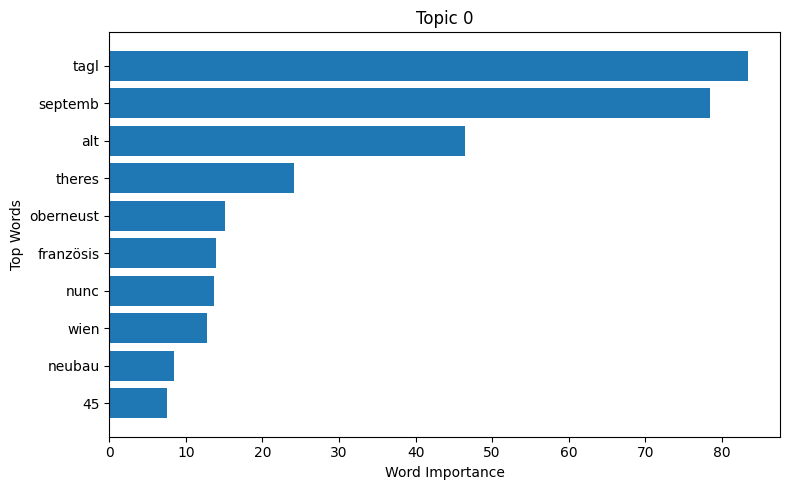

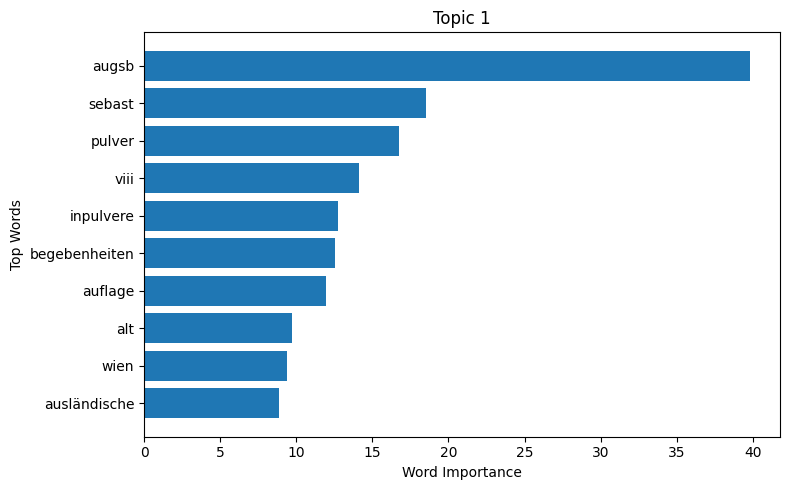

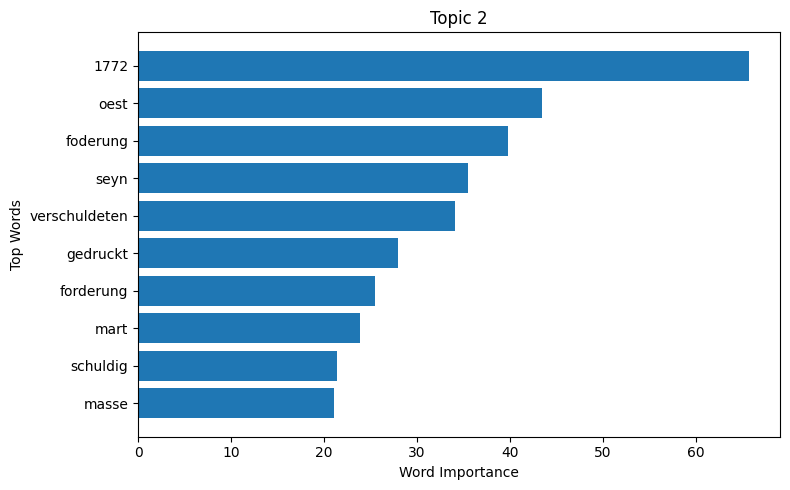

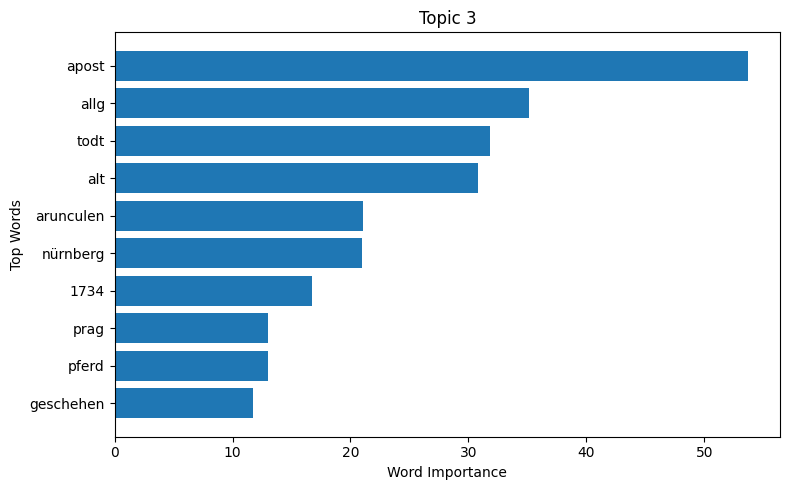

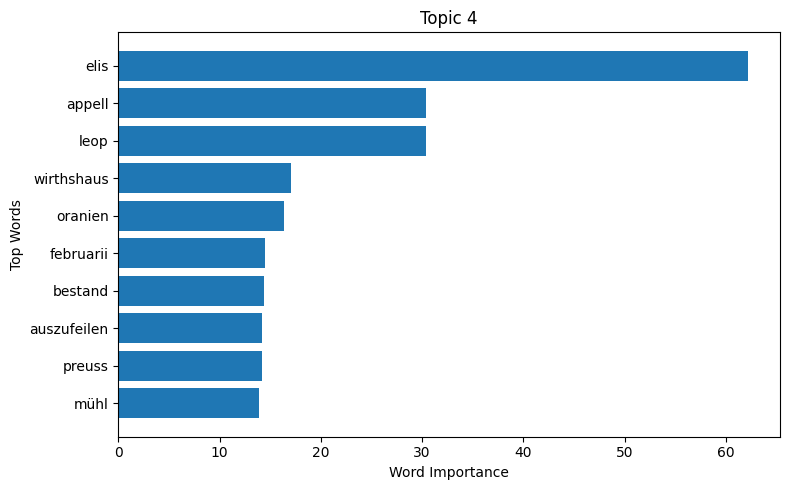

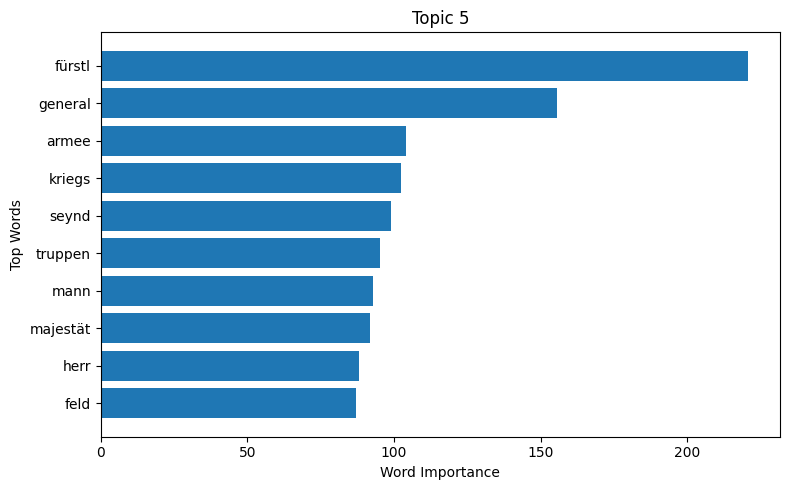

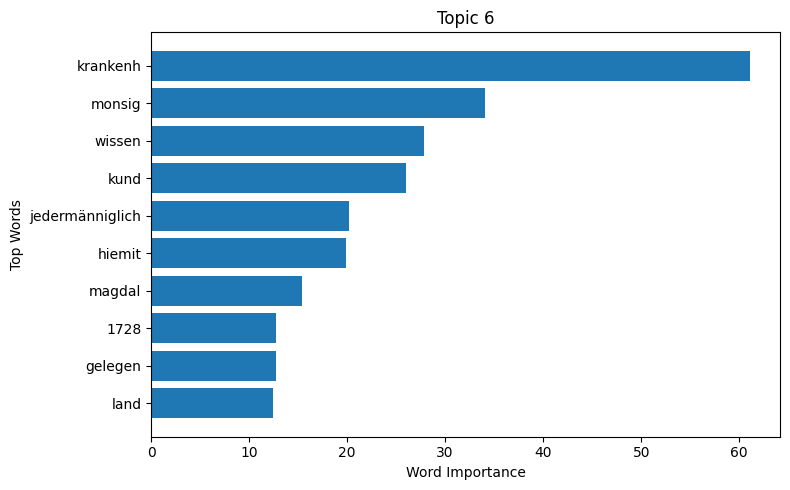

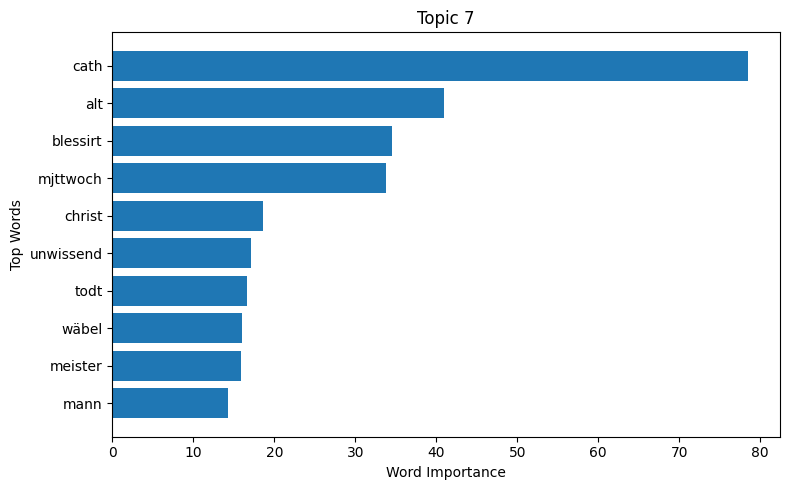

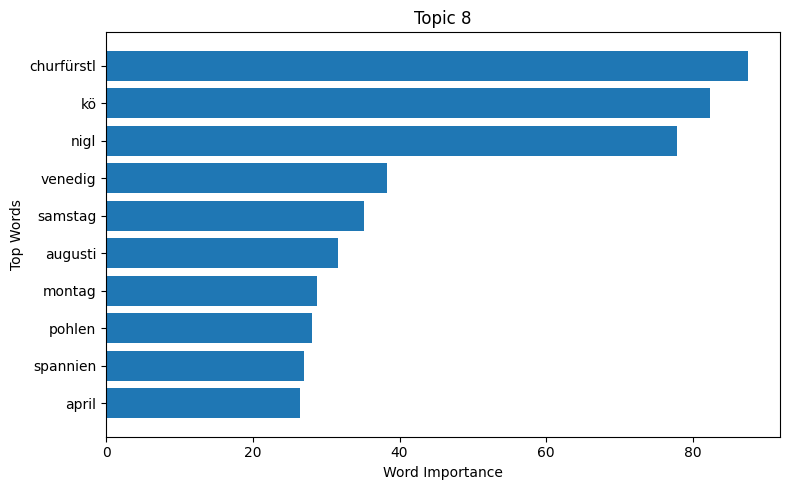

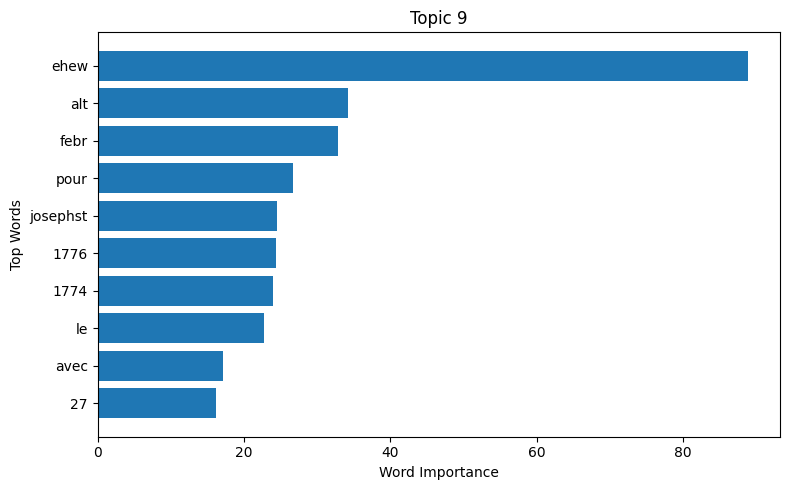

In [ ]:
import matplotlib.pyplot as plt

# Loop through topics
for topic_idx, topic in enumerate(lda_model.components_[:10]):  # show only first 10
    # Get indices of top 10 words
    top_indices = topic.argsort()[::-1][:10]

    # Get words and weights using the SAME indices
    top_words = [feature_names[i] for i in top_indices]
    top_weights = topic[top_indices]

    # Plot (reverse for better visual order: top word at top)
    plt.figure(figsize=(8, 5))
    plt.barh(top_words[::-1], top_weights[::-1])  # reverse both
    plt.title(f"Topic {topic_idx}")
    plt.xlabel("Word Importance")
    plt.ylabel("Top Words")
    plt.tight_layout()
    plt.show()


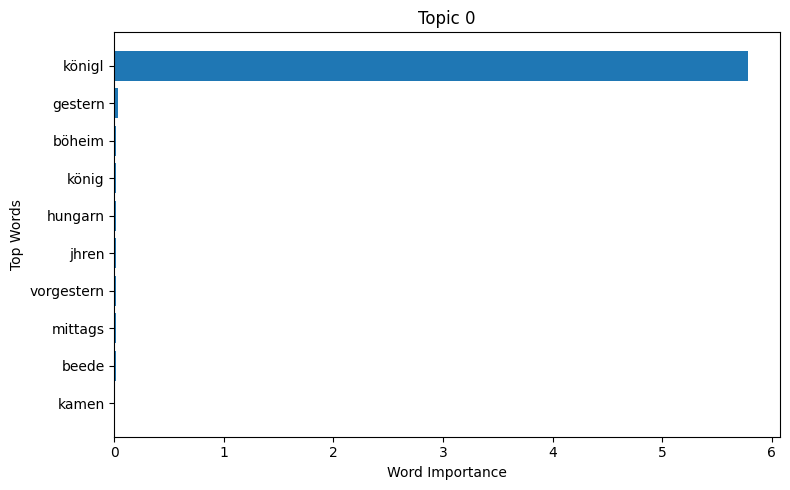

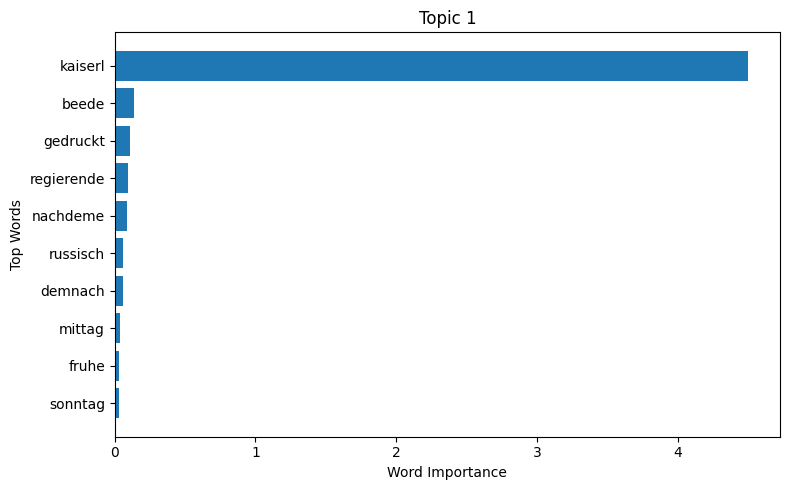

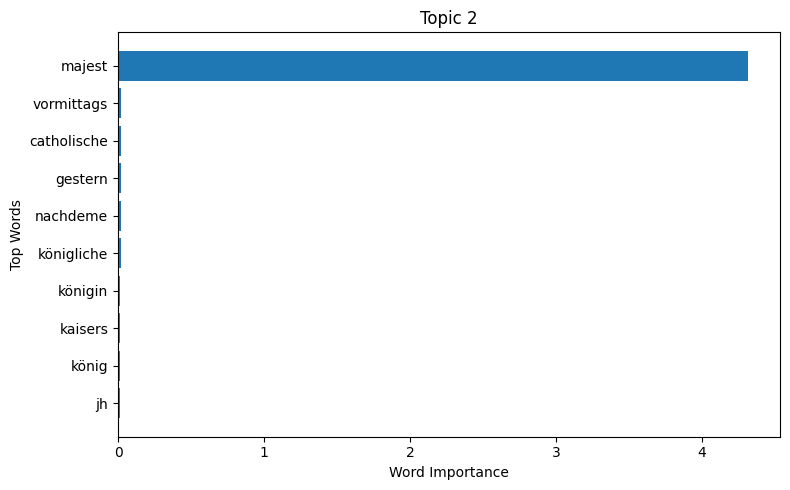

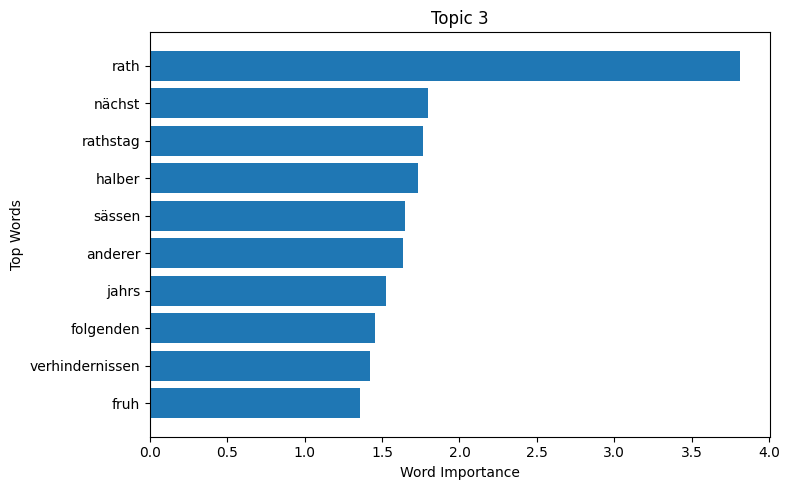

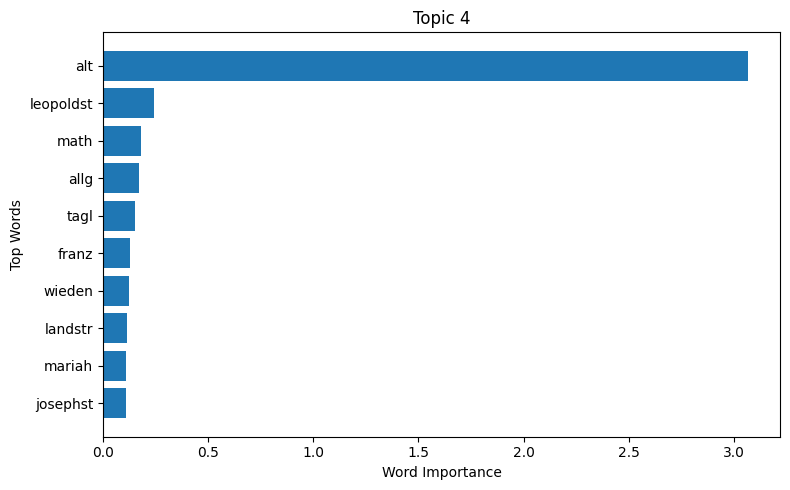

...

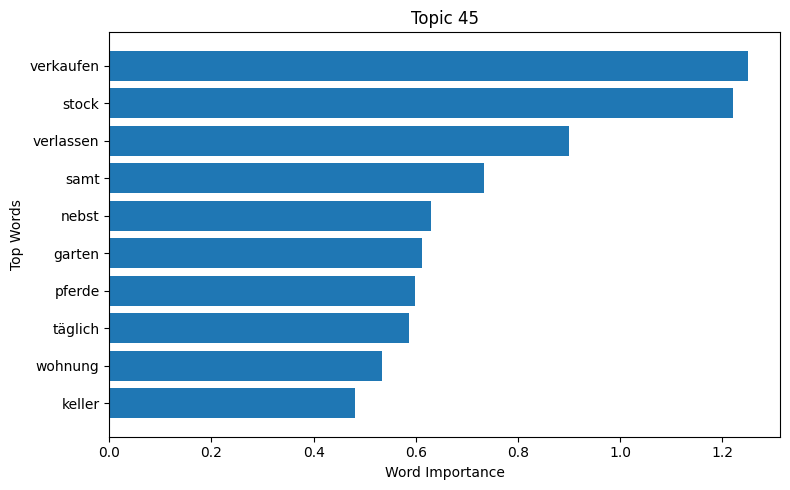

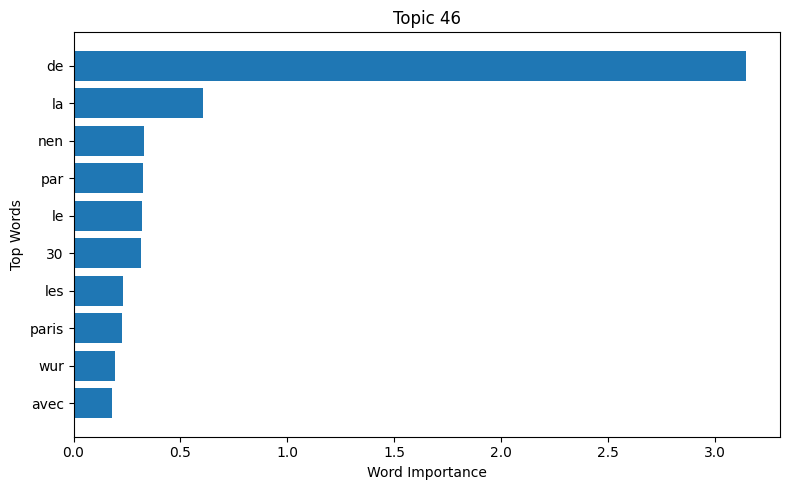

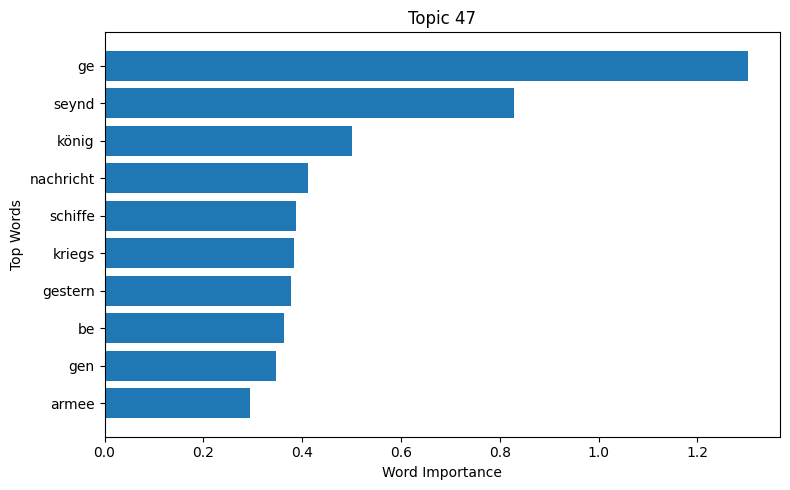

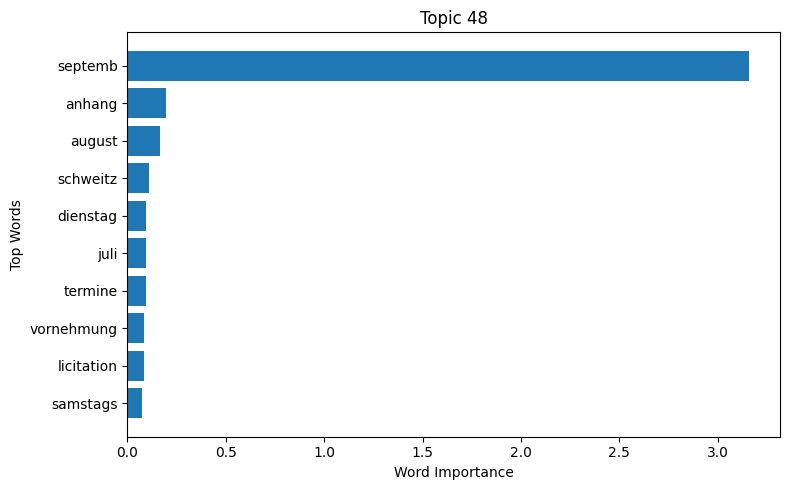

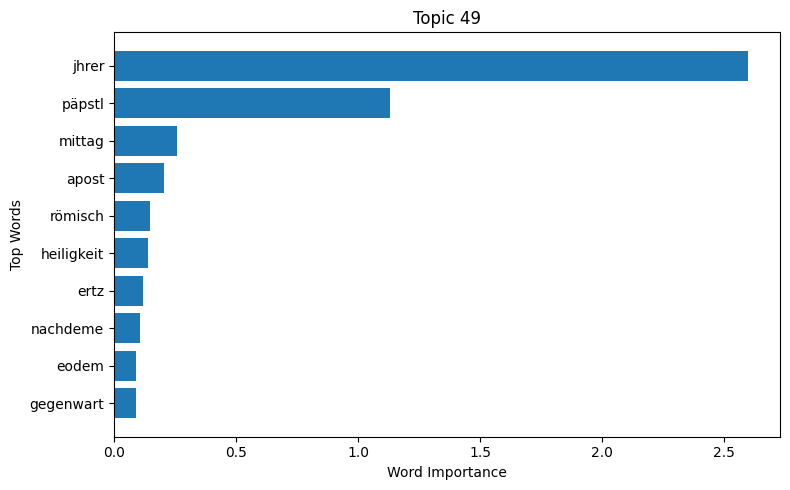

In [ ]:
import matplotlib.pyplot as plt

# Loop through topics
for topic_idx, topic in enumerate(nmf_model.components_[:50]):  # show only first 10
    # Get indices of top 10 words
    top_indices = topic.argsort()[::-1][:10]

    # Get words and weights using the SAME indices
    top_words = [feature_names[i] for i in top_indices]
    top_weights = topic[top_indices]

    # Plot (reverse for better visual order: top word at top)
    plt.figure(figsize=(8, 5))
    plt.barh(top_words[::-1], top_weights[::-1])  # reverse both
    plt.title(f"Topic {topic_idx}")
    plt.xlabel("Word Importance")
    plt.ylabel("Top Words")
    plt.tight_layout()
    plt.show()


Topic 0:


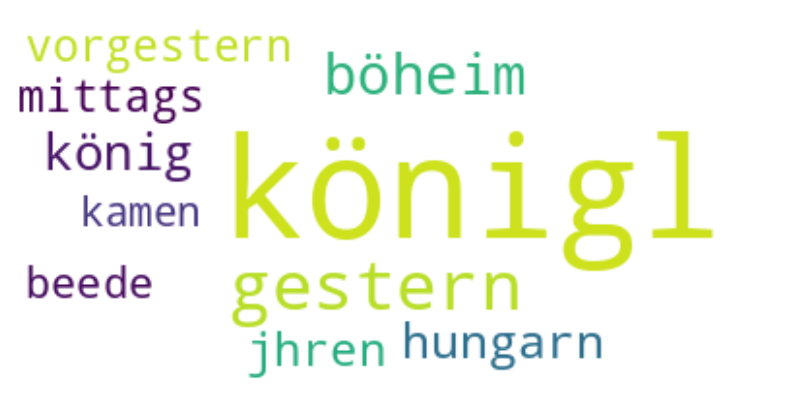

Topic 1:


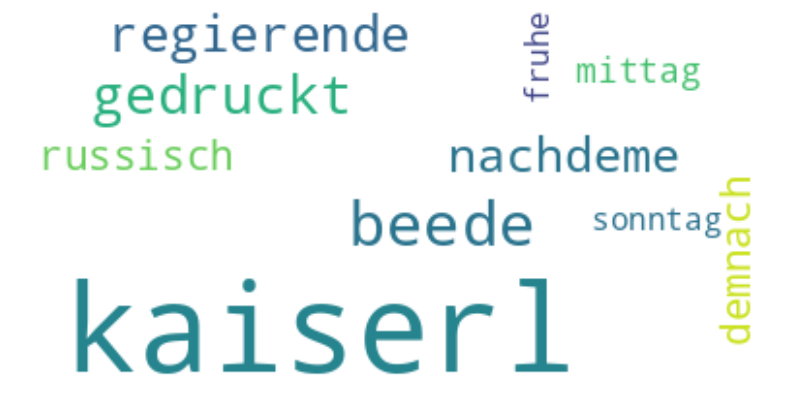

Topic 2:


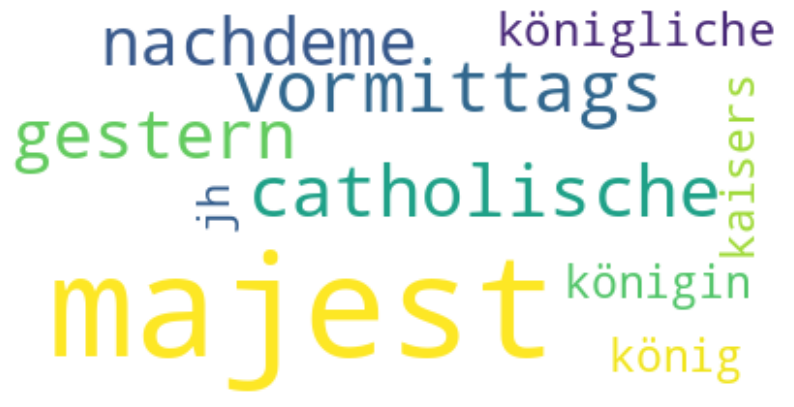

Topic 3:


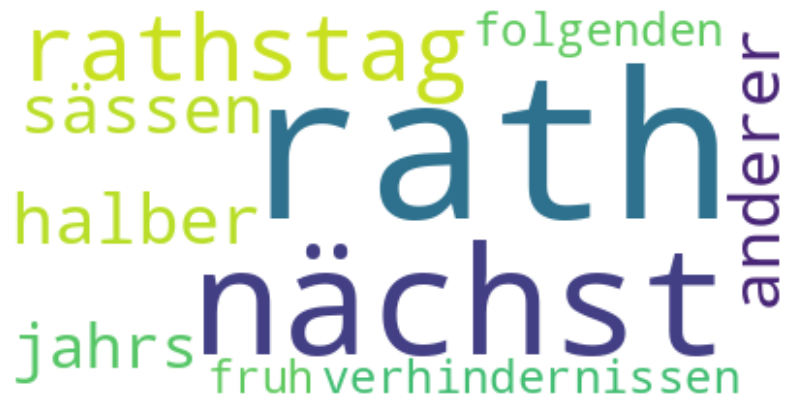

Topic 4:


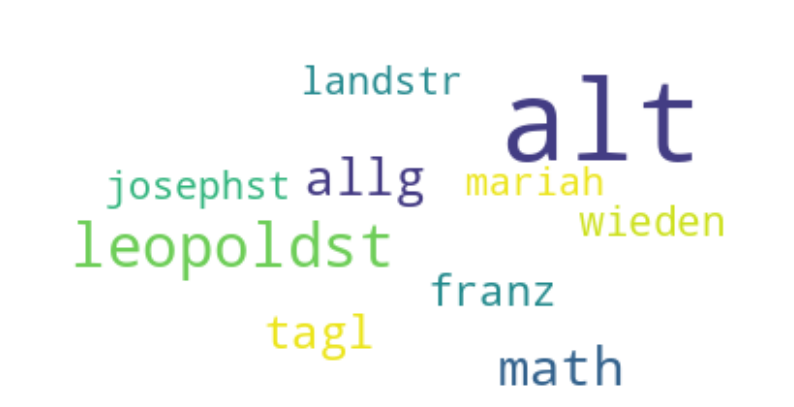

Topic 5:


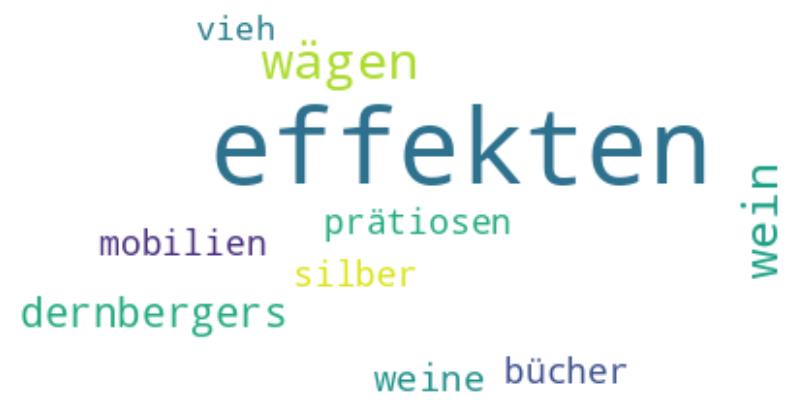

Topic 6:


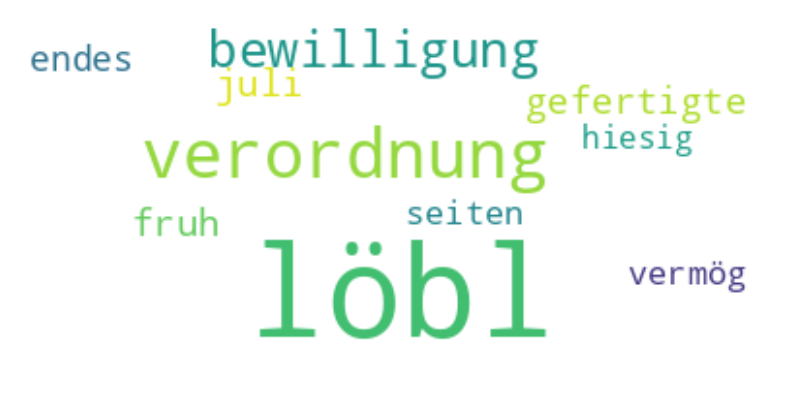

Topic 7:


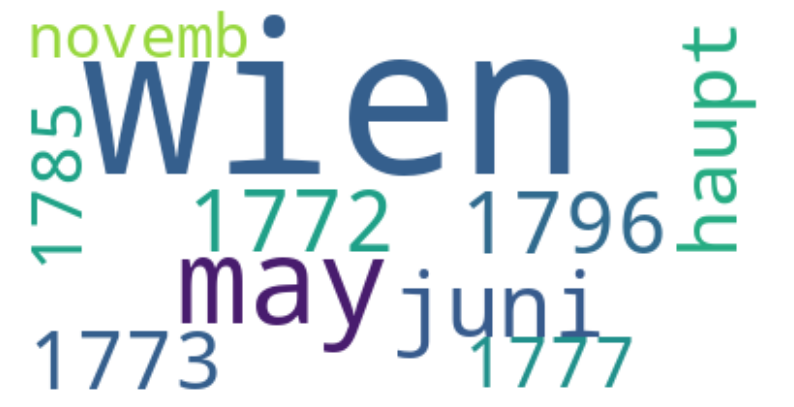

Topic 8:


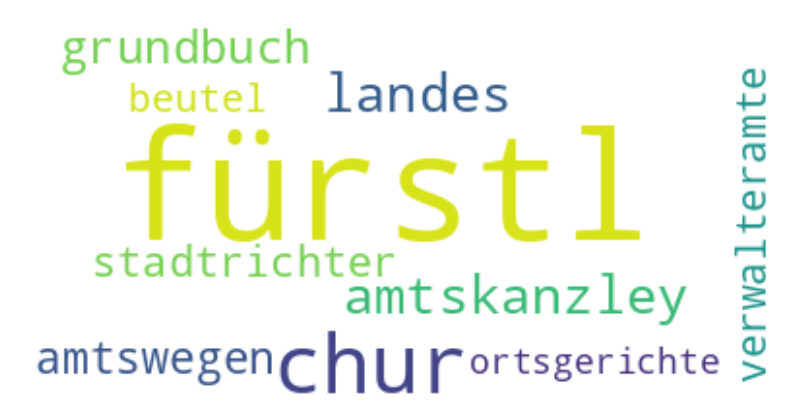

Topic 9:


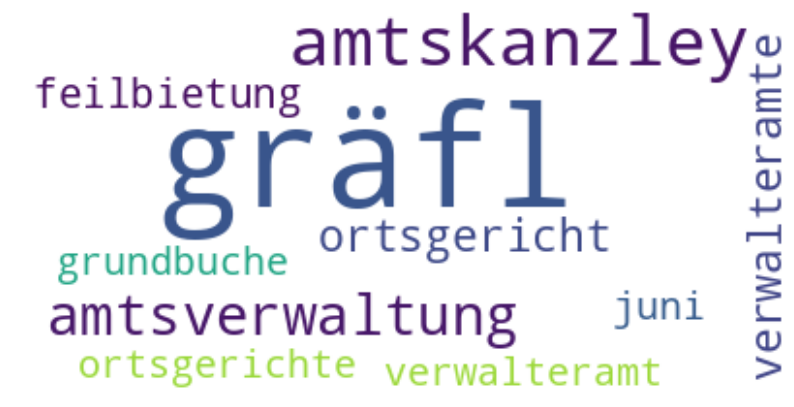

Topic 10:


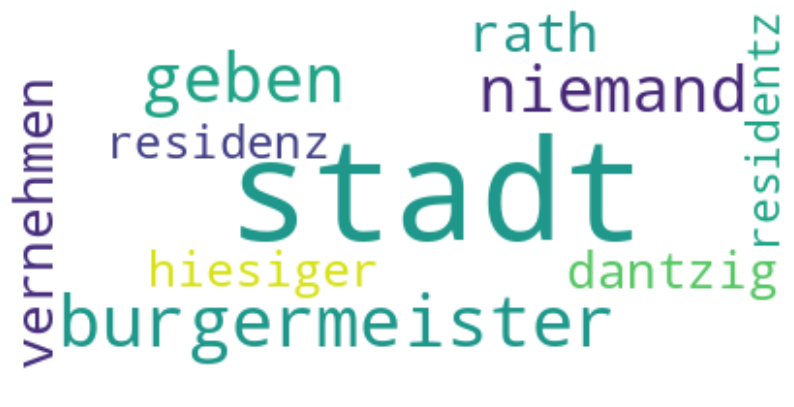

Topic 11:


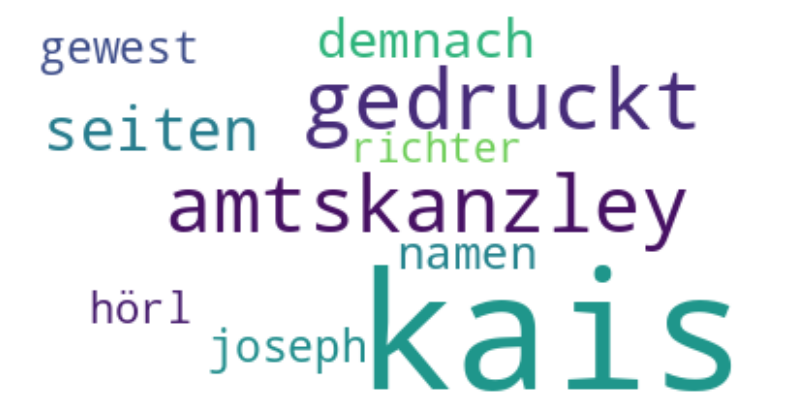

Topic 12:


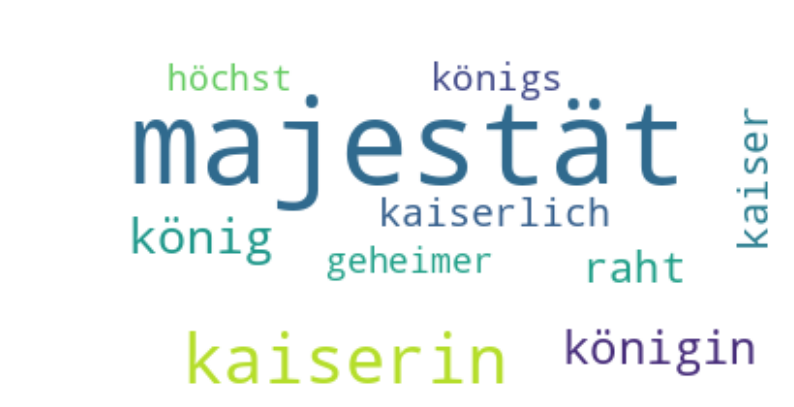

Topic 13:


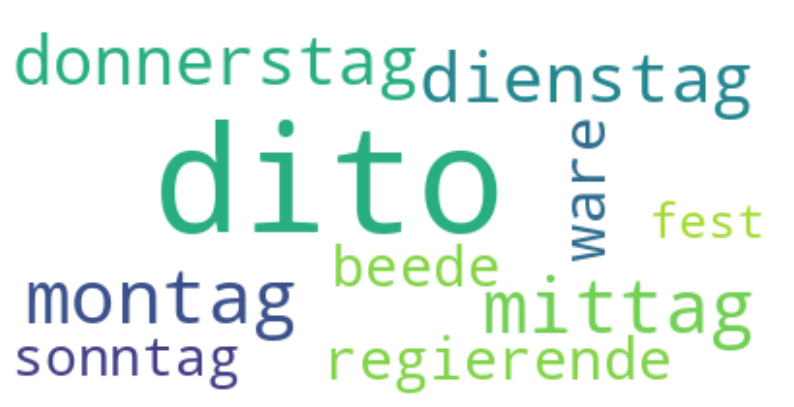

Topic 14:


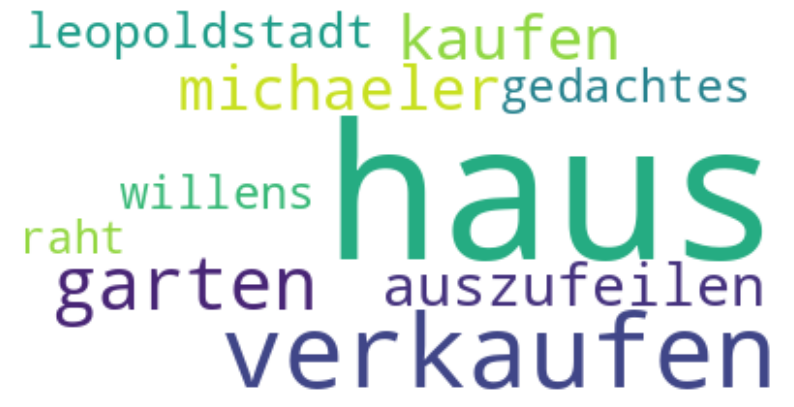

Topic 15:


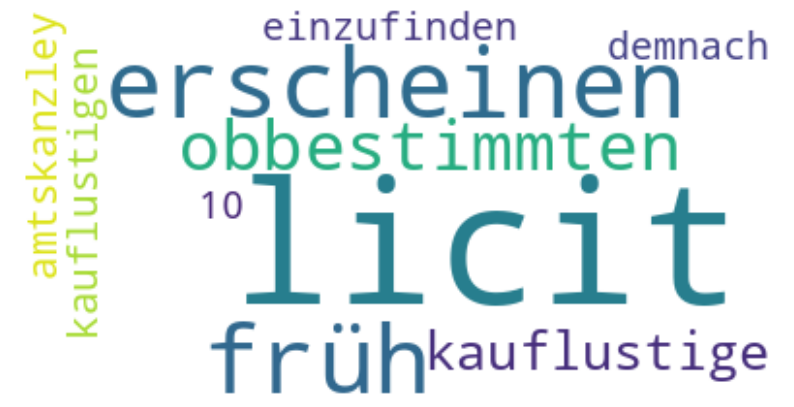

Topic 16:


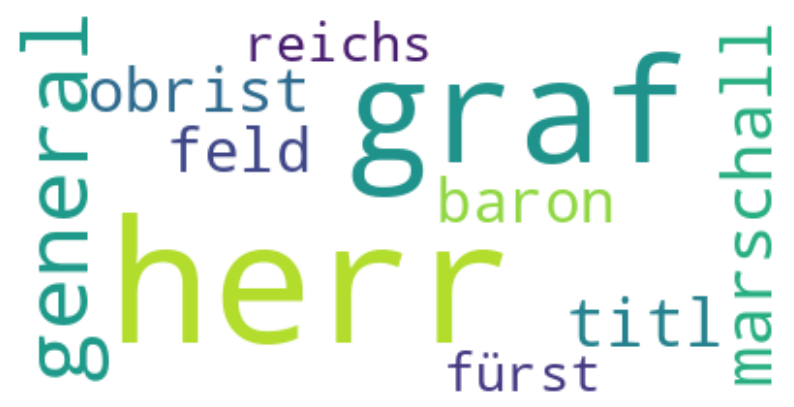

Topic 17:


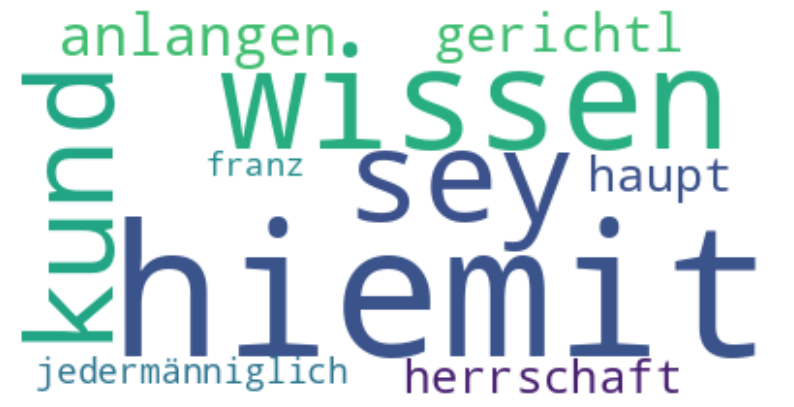

Topic 18:


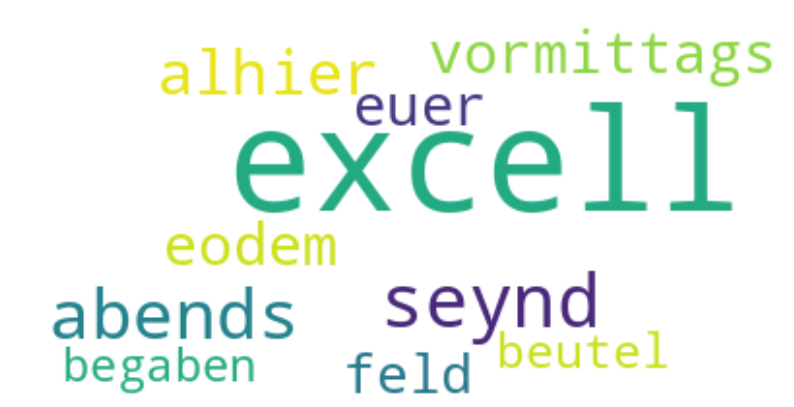

Topic 19:


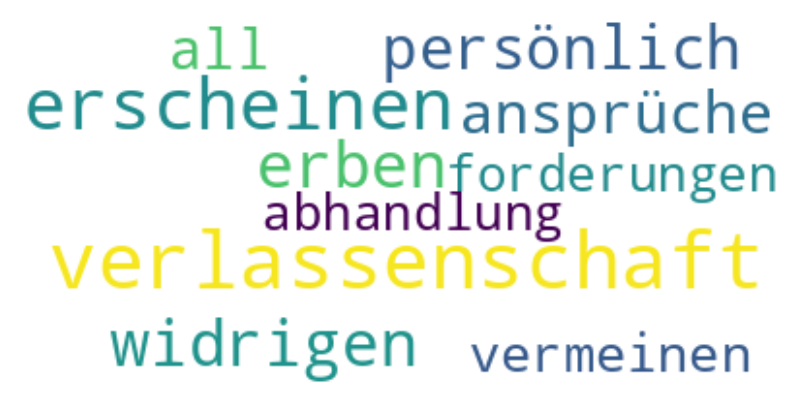

Topic 20:


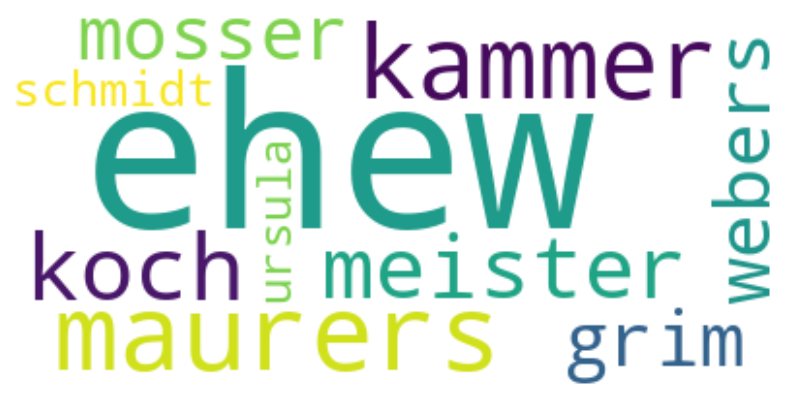

Topic 21:


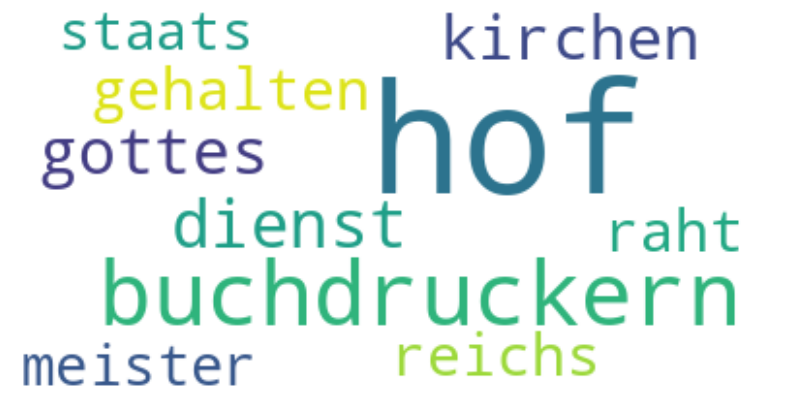

Topic 22:


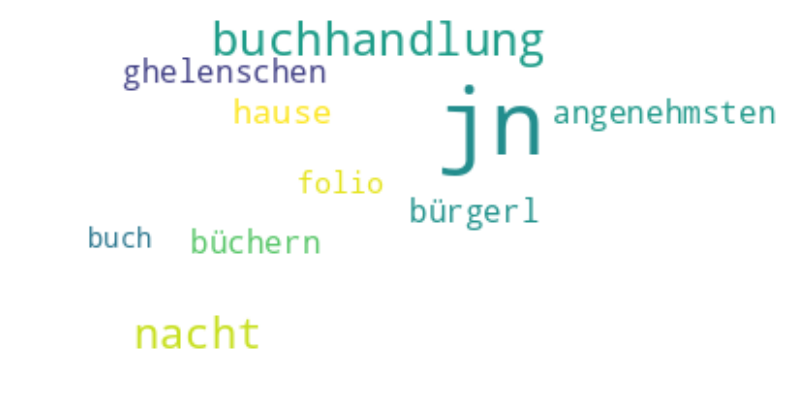

Topic 23:


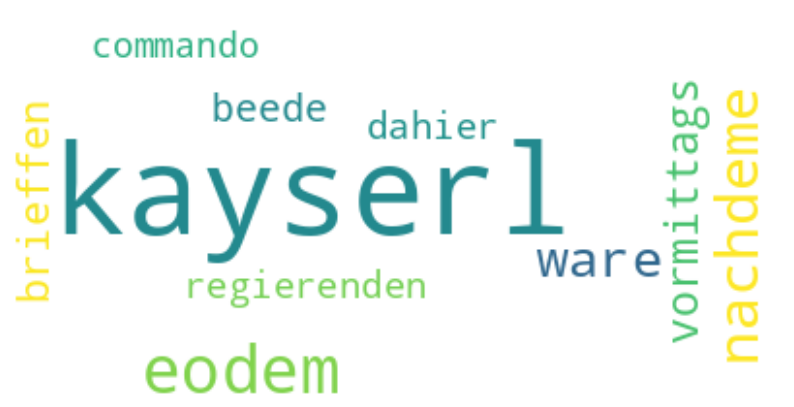

Topic 24:


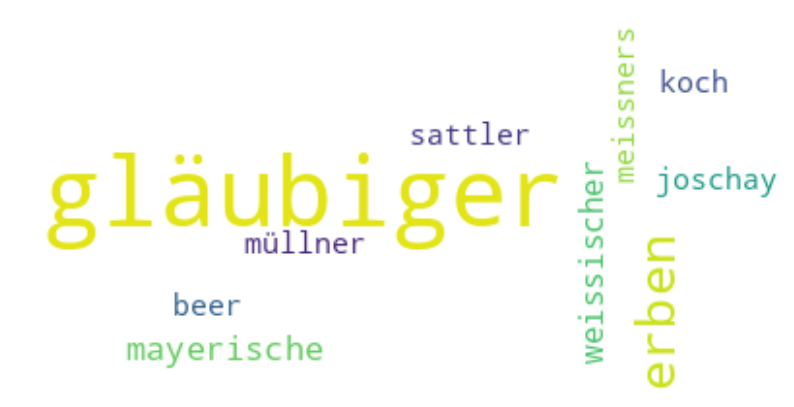

Topic 25:


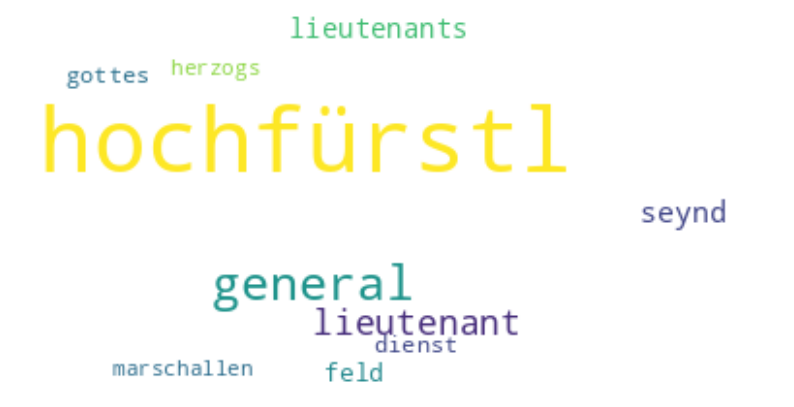

Topic 26:


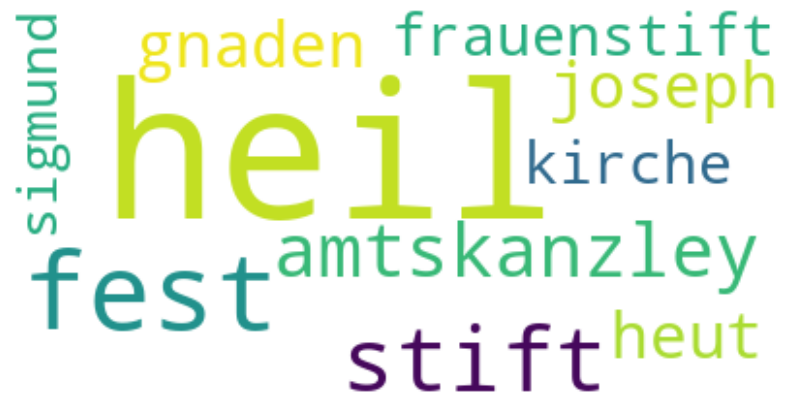

Topic 27:


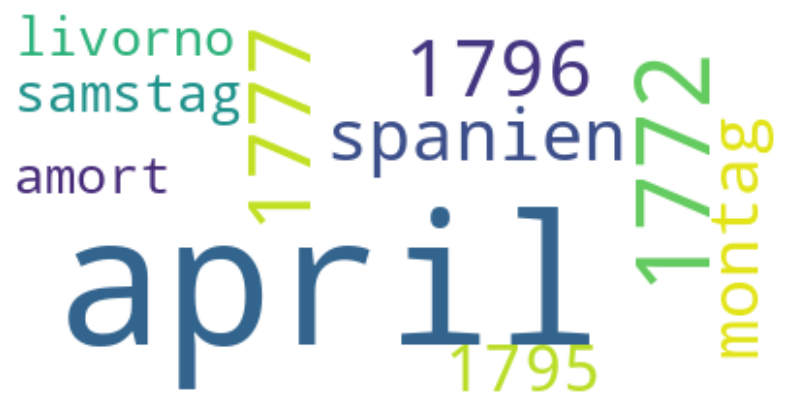

Topic 28:


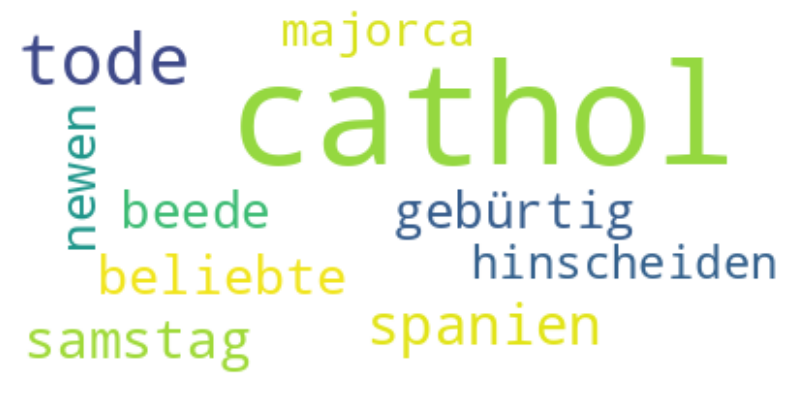

Topic 29:


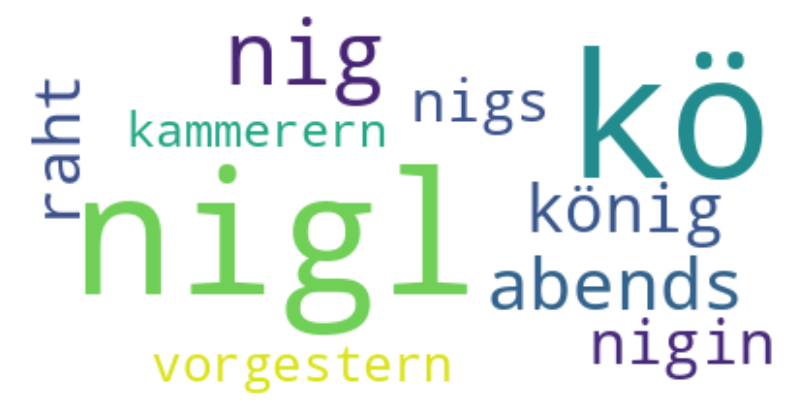

Topic 30:


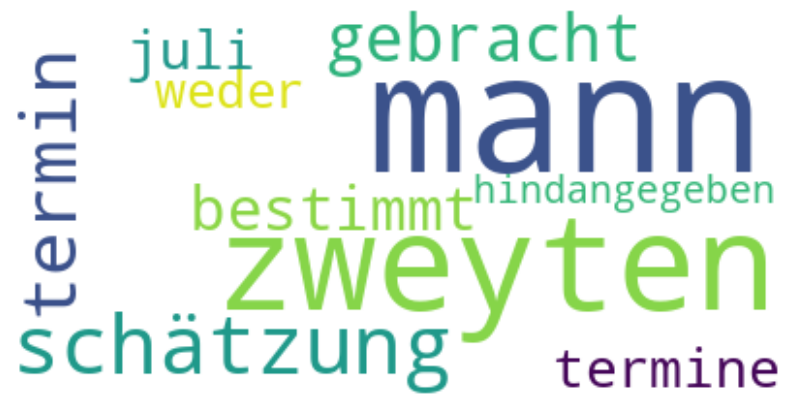

Topic 31:


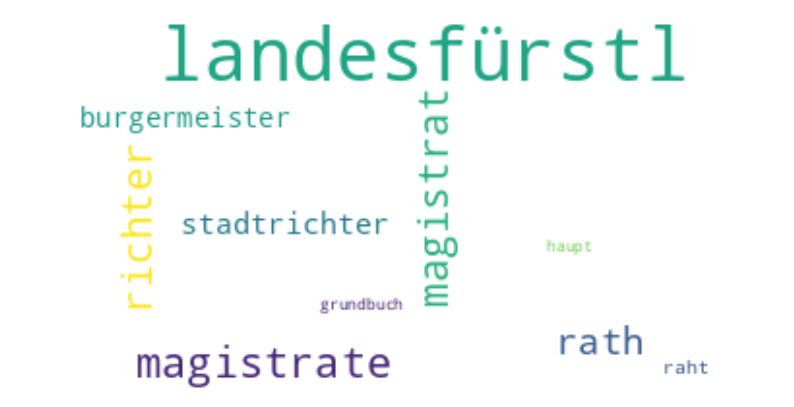

Topic 32:


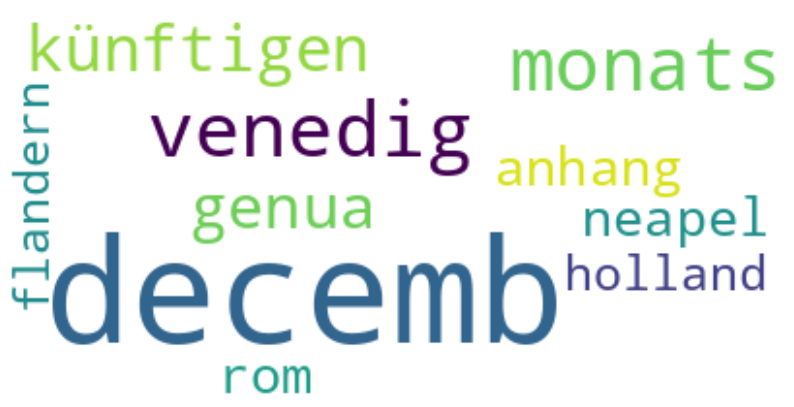

Topic 33:


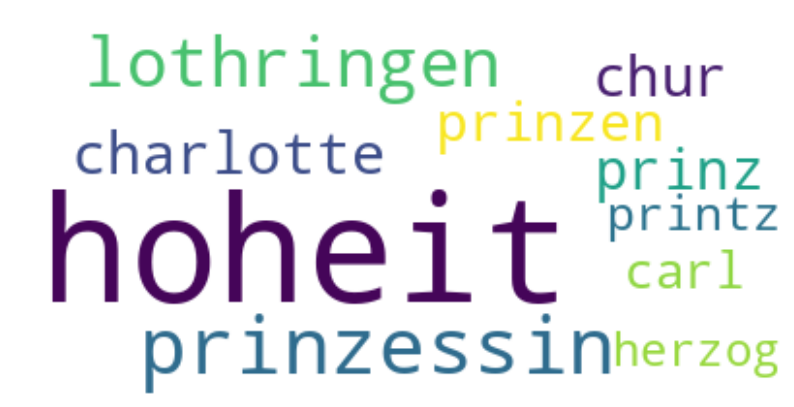

Topic 34:


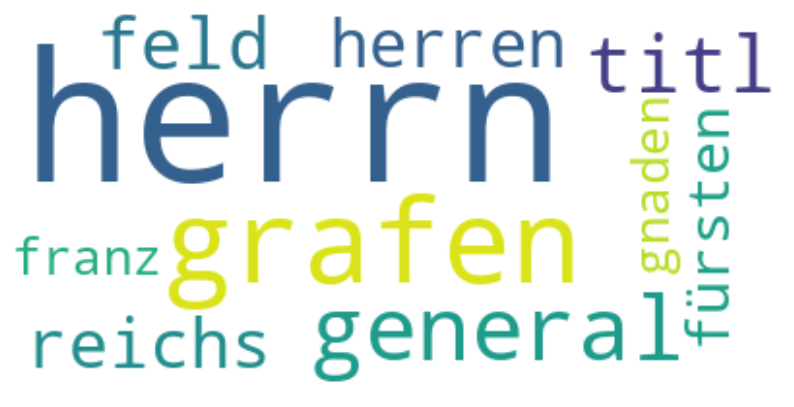

Topic 35:


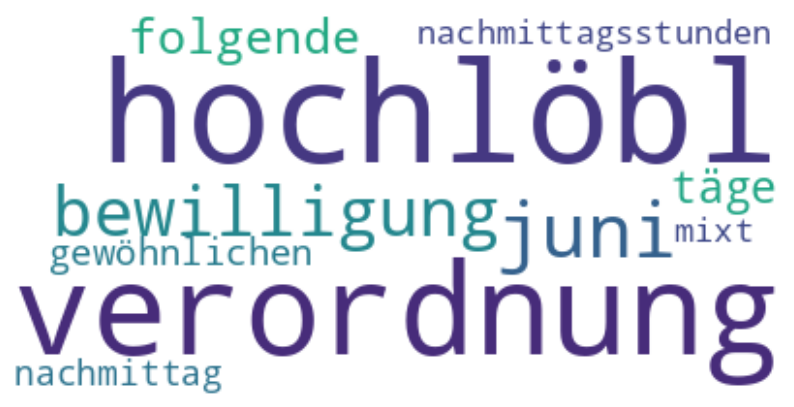

Topic 36:


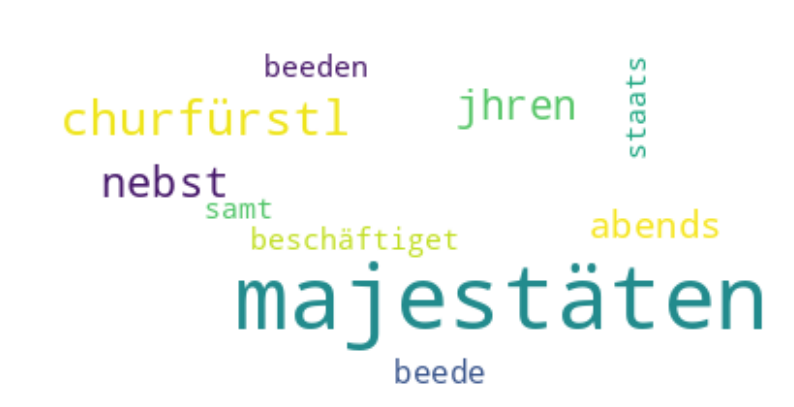

Topic 37:


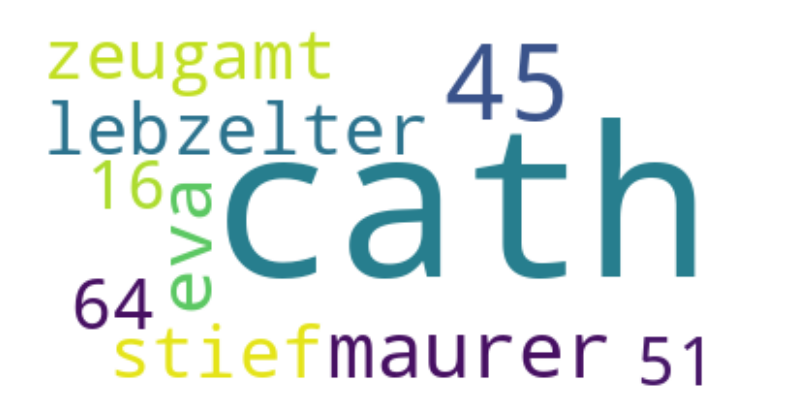

Topic 38:


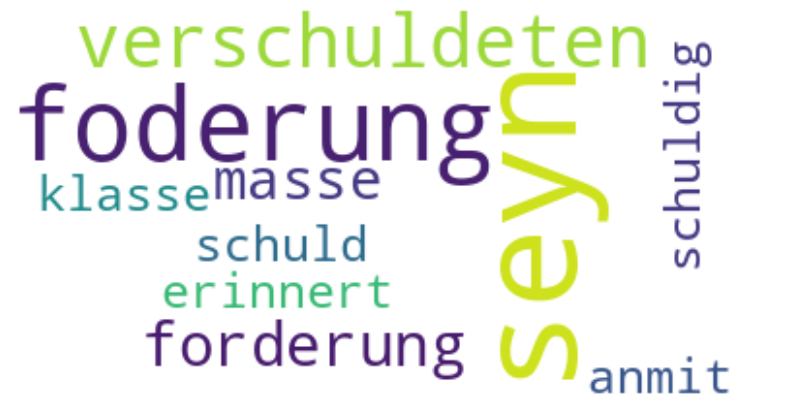

Topic 39:


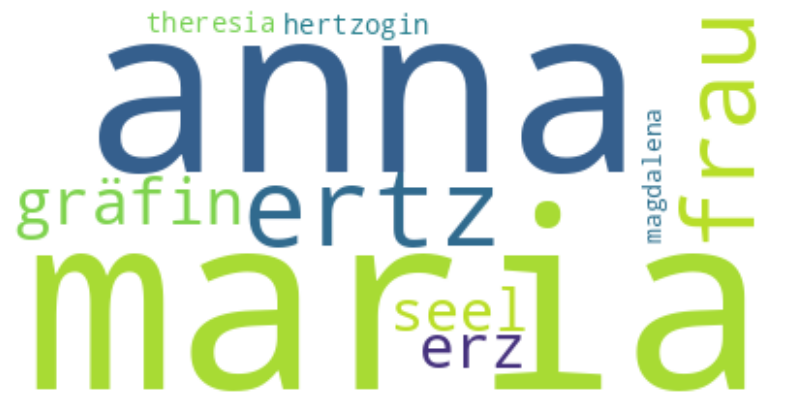

Topic 40:


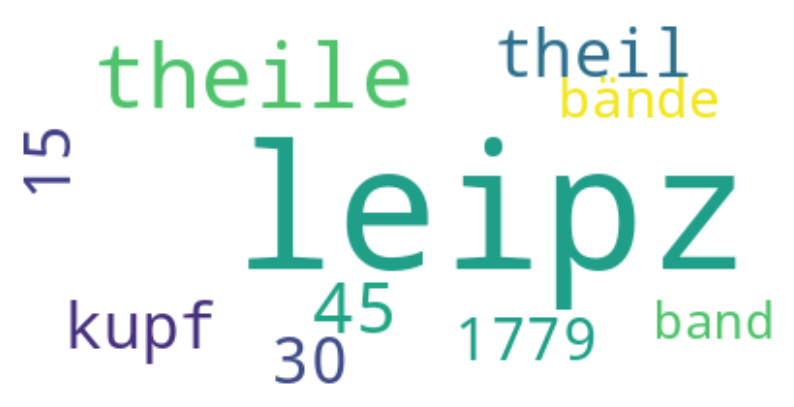

Topic 41:


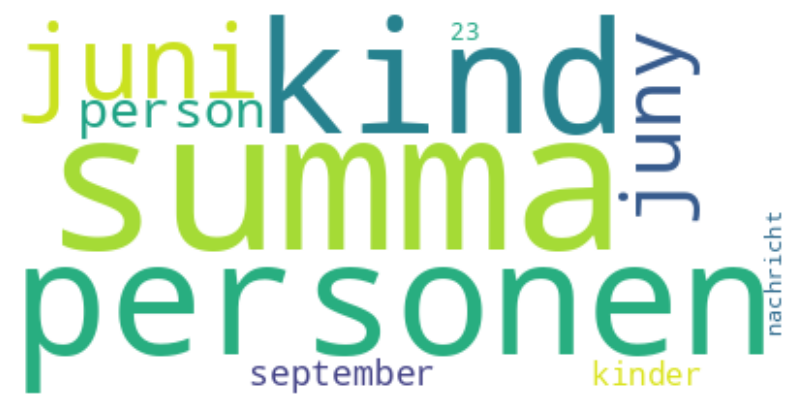

Topic 42:


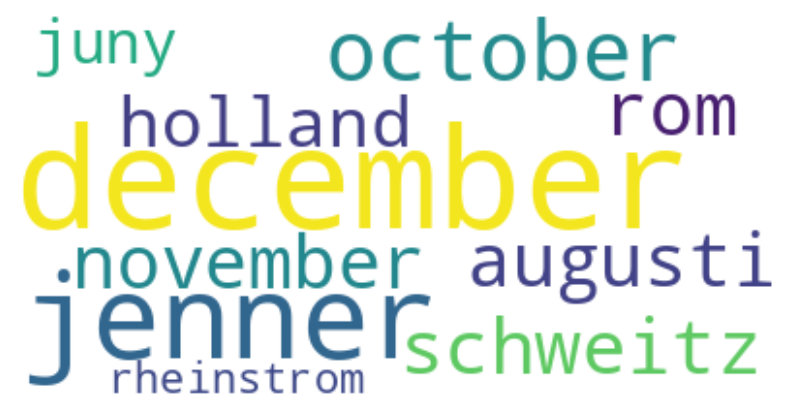

Topic 43:


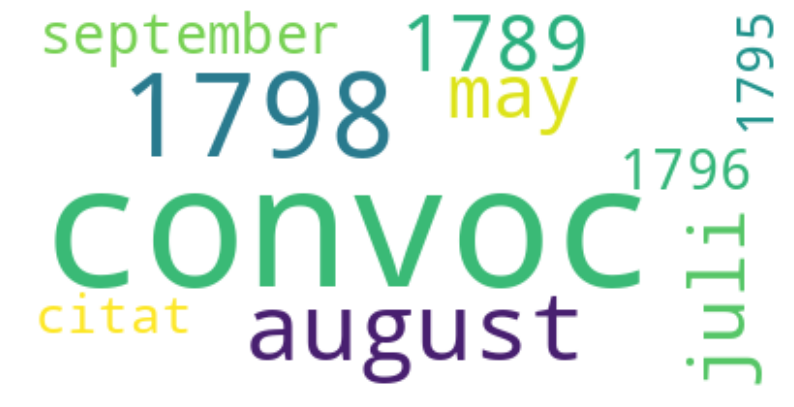

Topic 44:


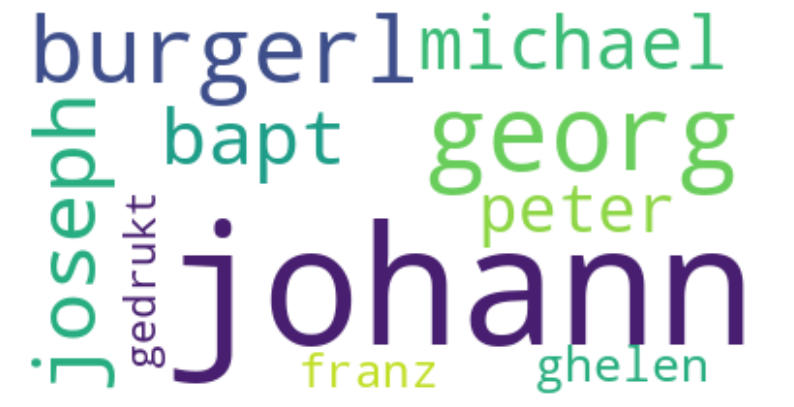

Topic 45:


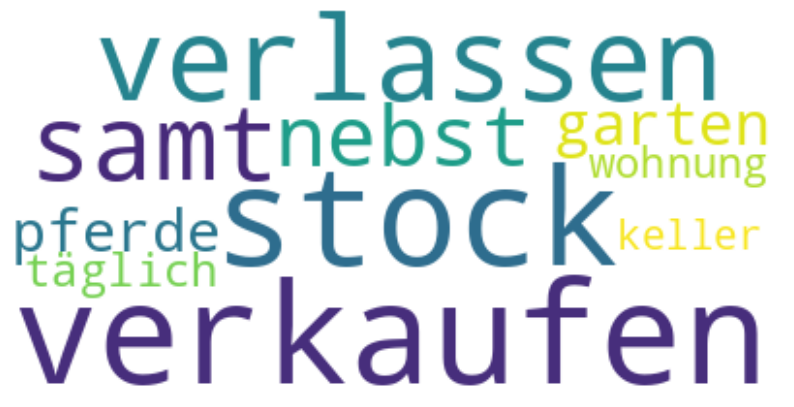

Topic 46:


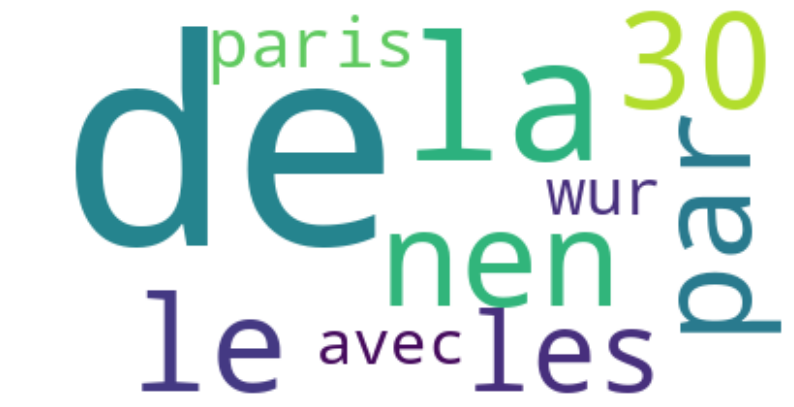

Topic 47:


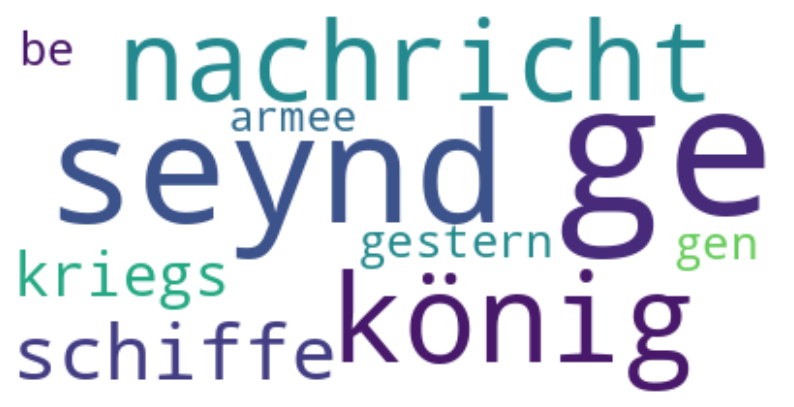

Topic 48:


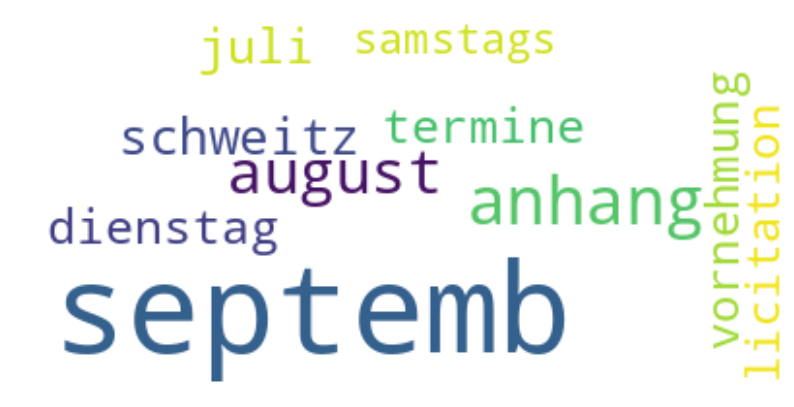

Topic 49:


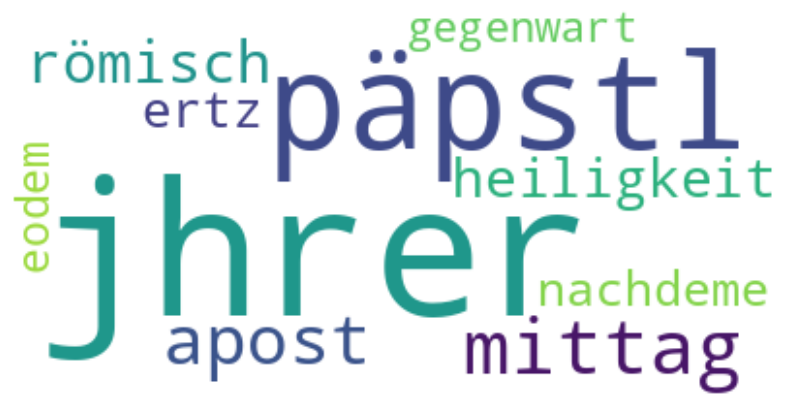

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def display_wordcloud(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx}:")

        # get the top words for this topic
        top_words = [feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]
        top_words_weights = sorted(topic)[:-no_top_words - 1:-1]

        # generate word cloud
        wordcloud_dict = {word: weight for word, weight in zip(top_words, top_words_weights)}
        wordcloud = WordCloud(background_color='white').generate_from_frequencies(wordcloud_dict)

        plt.figure(figsize=(10, 10))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()

no_top_words = 10  # change to get more or fewer top words

display_wordcloud(nmf, feature_names, no_top_words)



Topic 1:


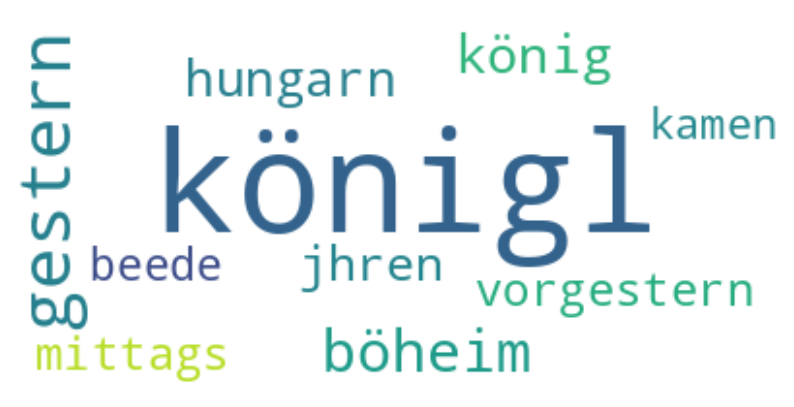

Topic 2:


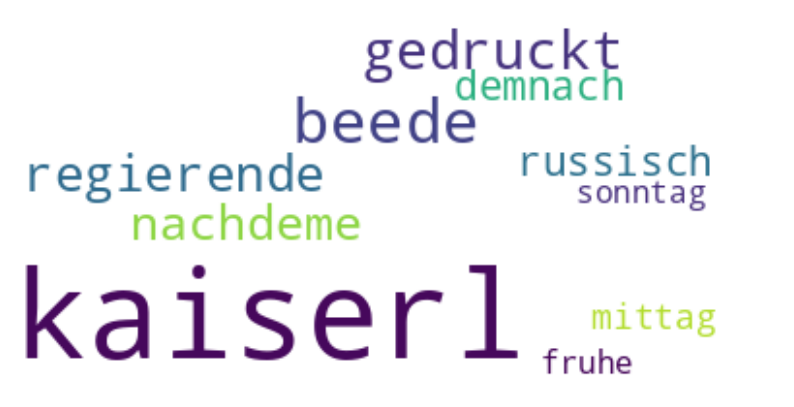

Topic 3:


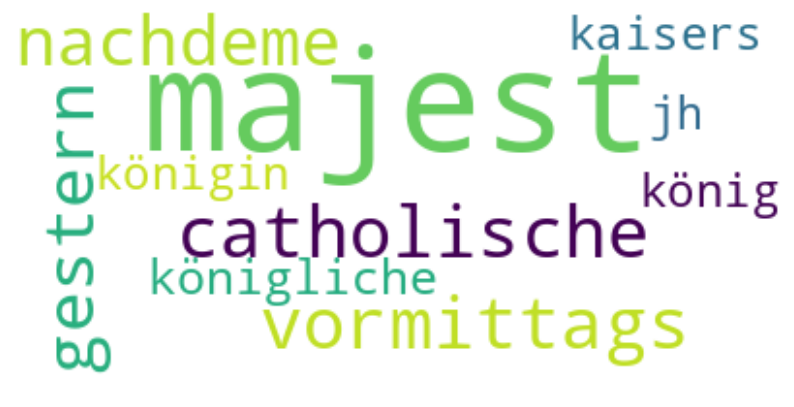

Topic 4:


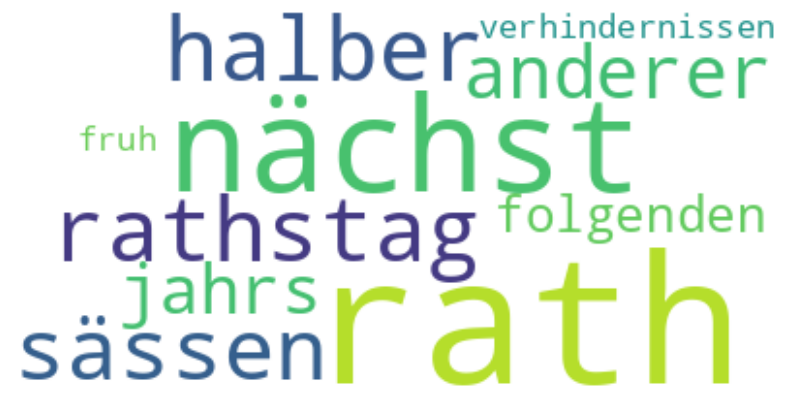

Topic 5:


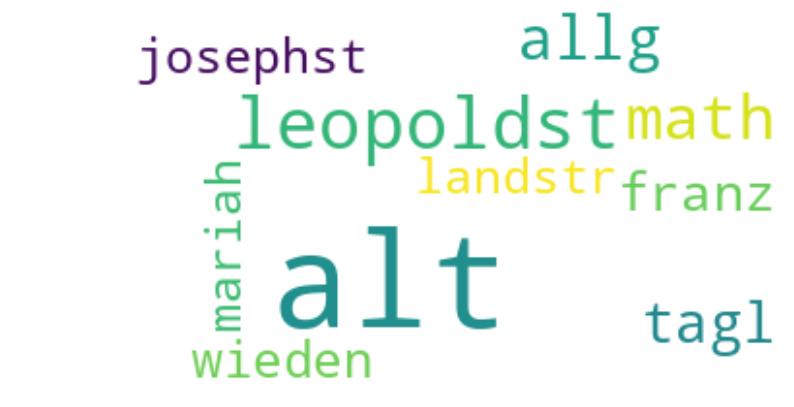

Topic 6:


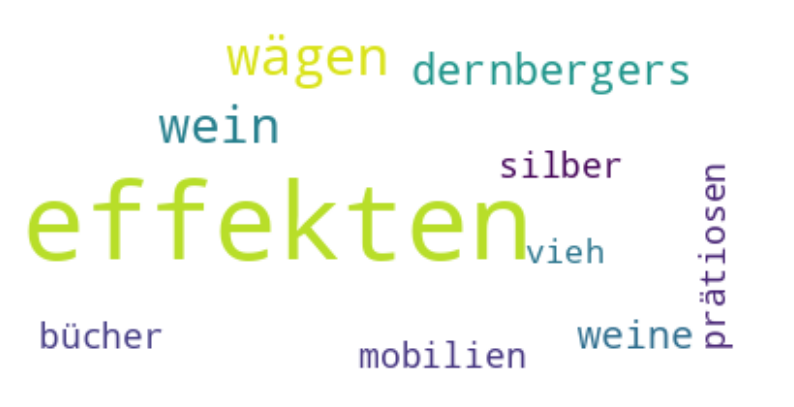

Topic 7:


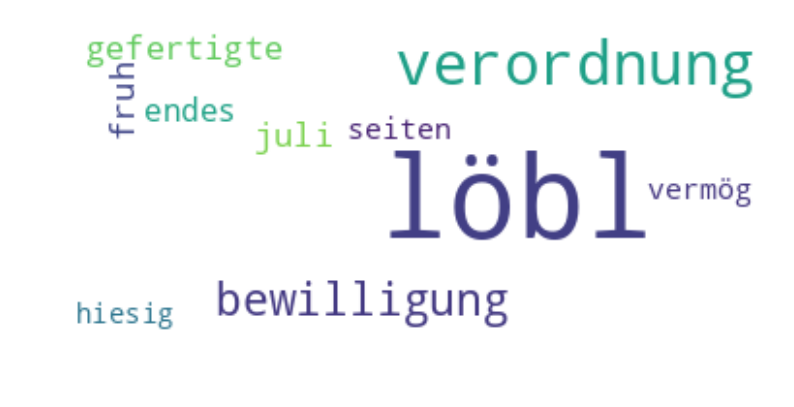

Topic 8:


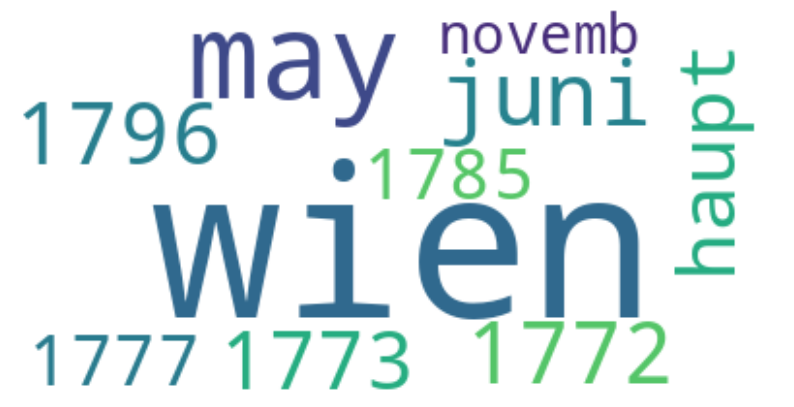

Topic 9:


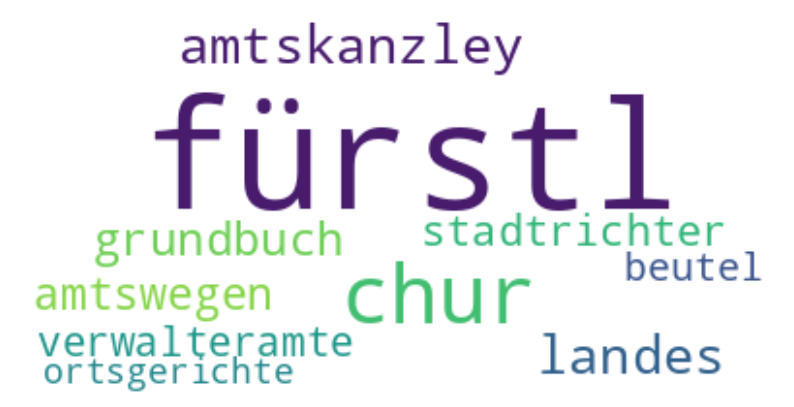

Topic 10:


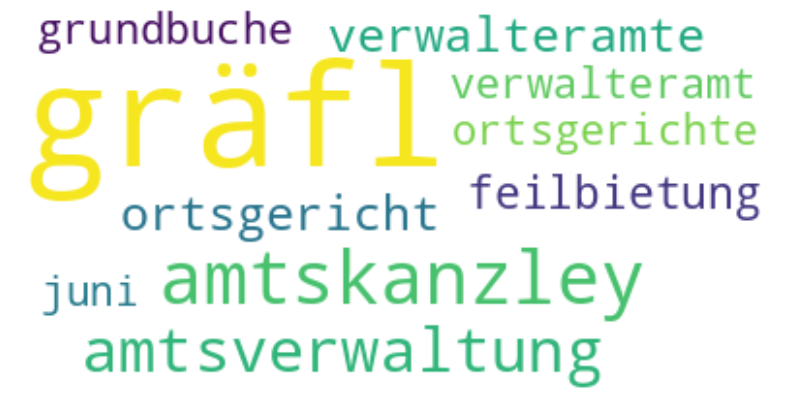

Topic 11:


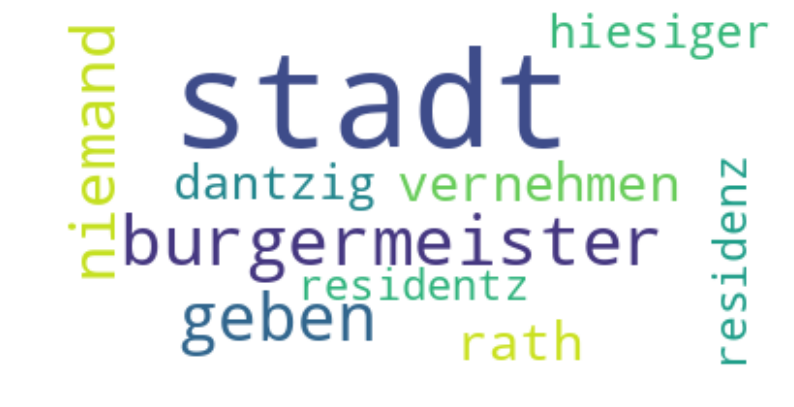

Topic 12:


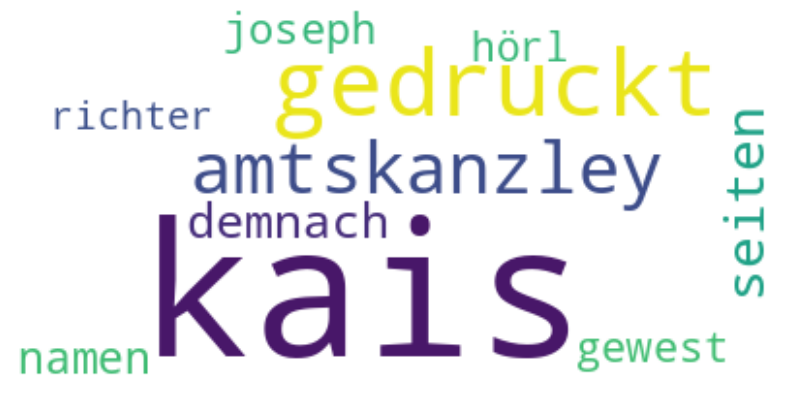

Topic 13:


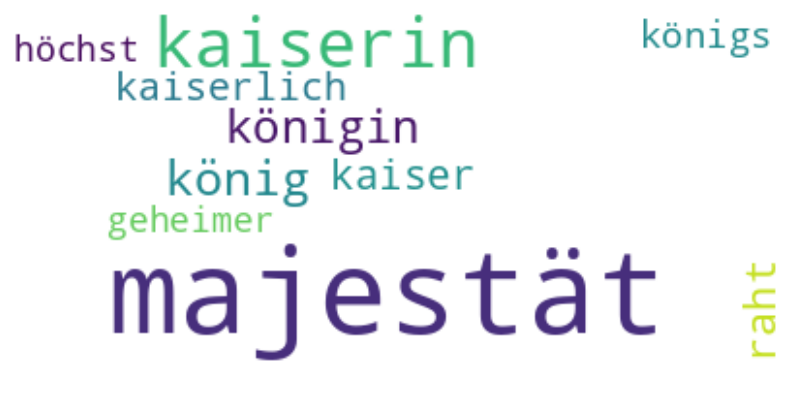

Topic 14:


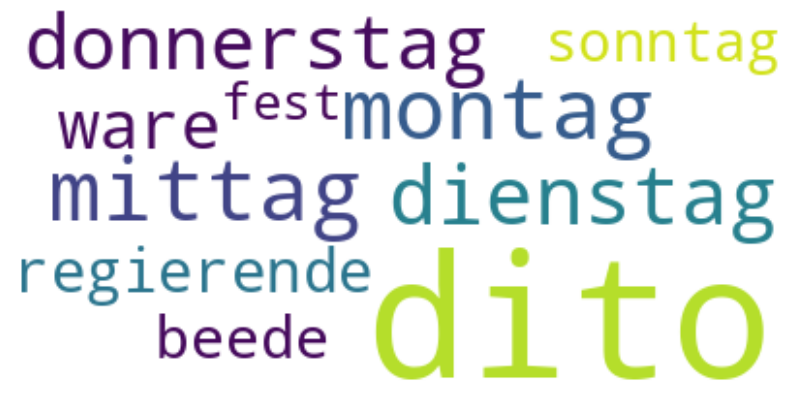

Topic 15:


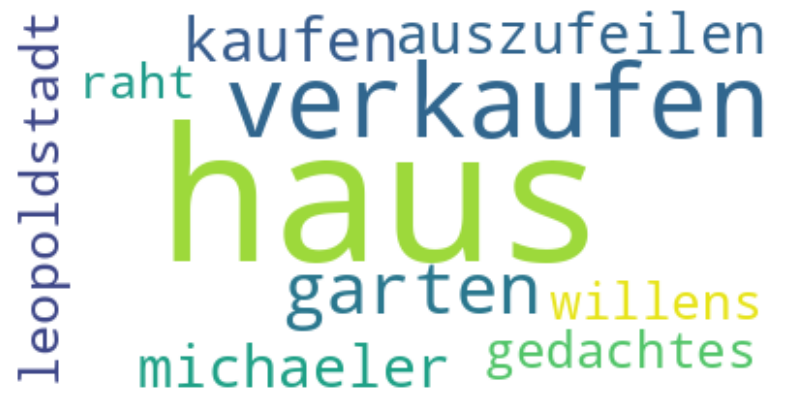

Topic 16:


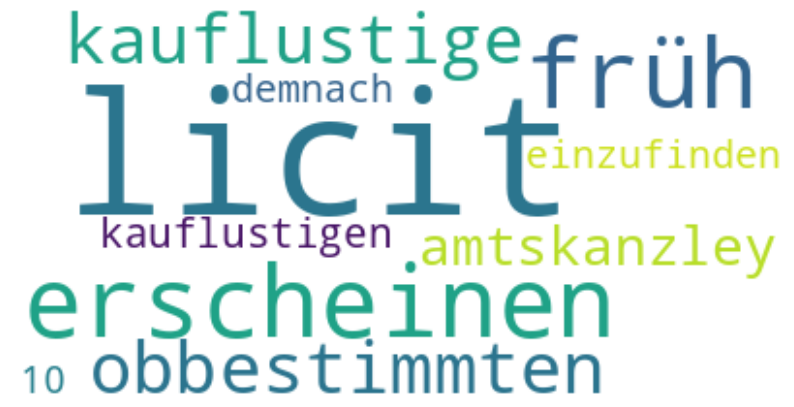

Topic 17:


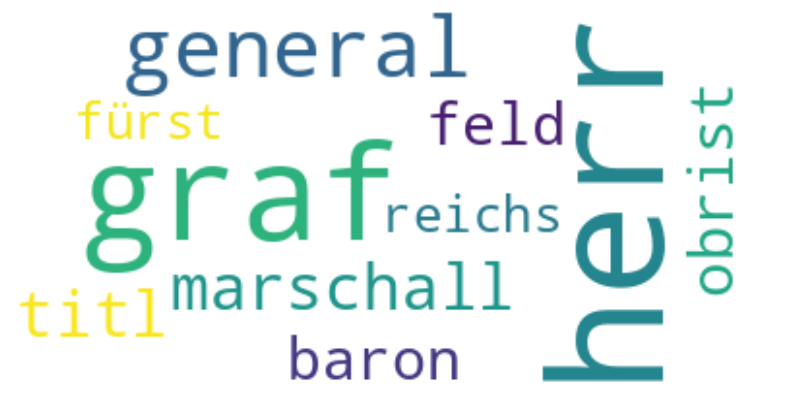

Topic 18:


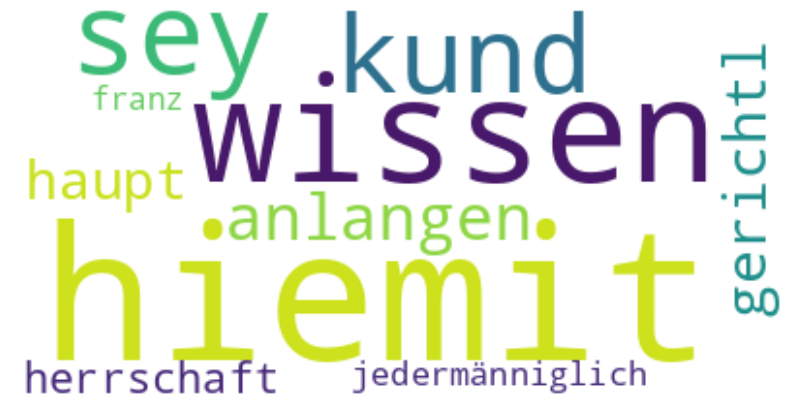

Topic 19:


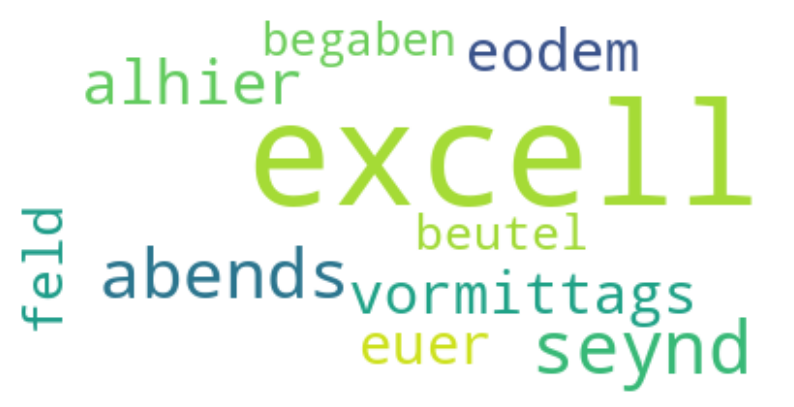

Topic 20:


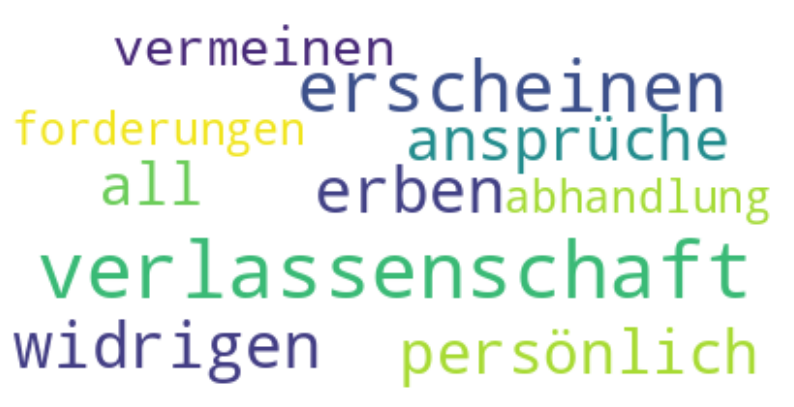

Topic 21:


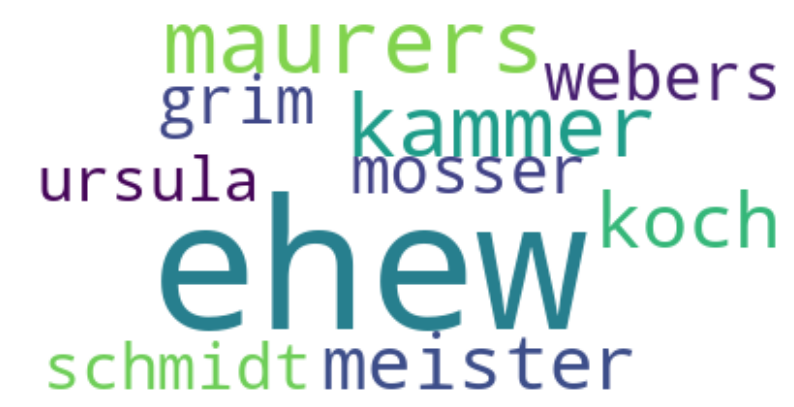

Topic 22:


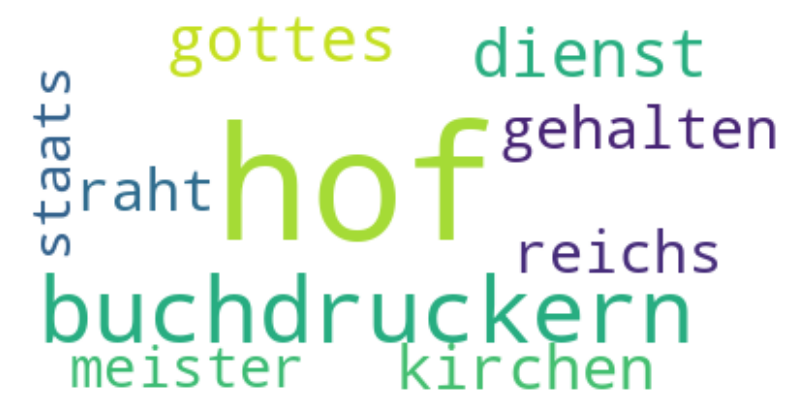

Topic 23:


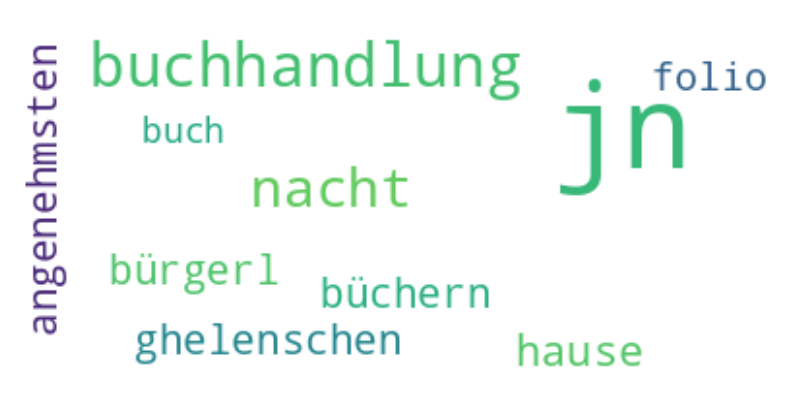

Topic 24:


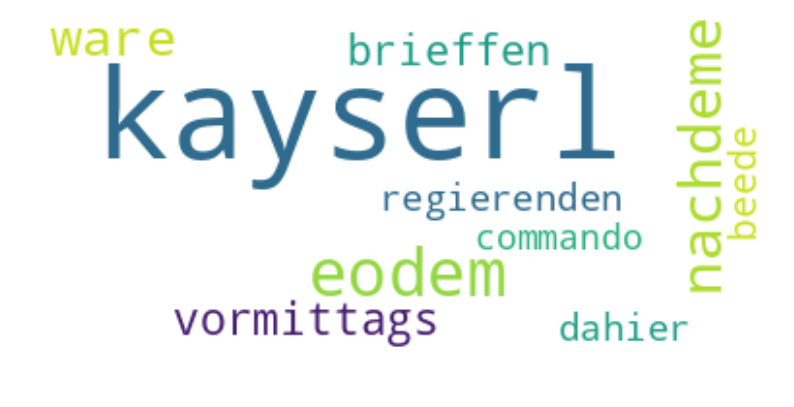

Topic 25:


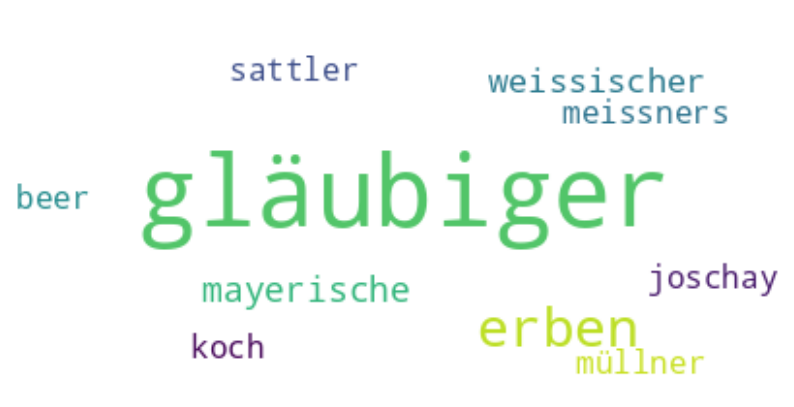

Topic 26:


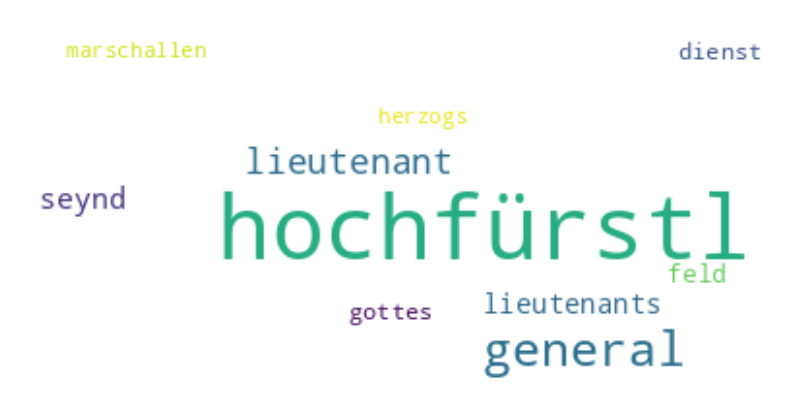

Topic 27:


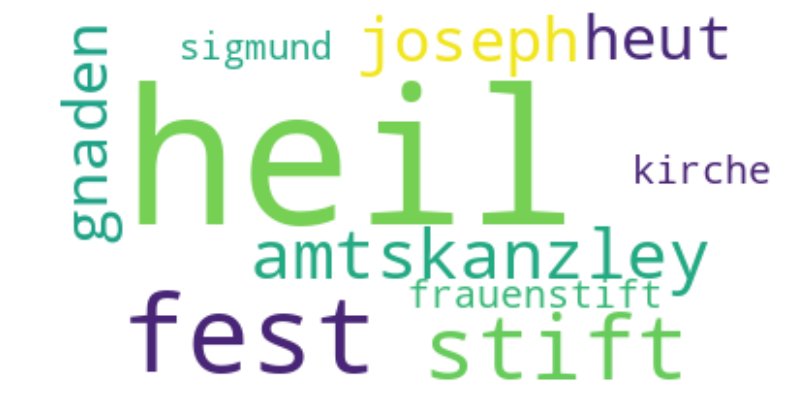

Topic 28:


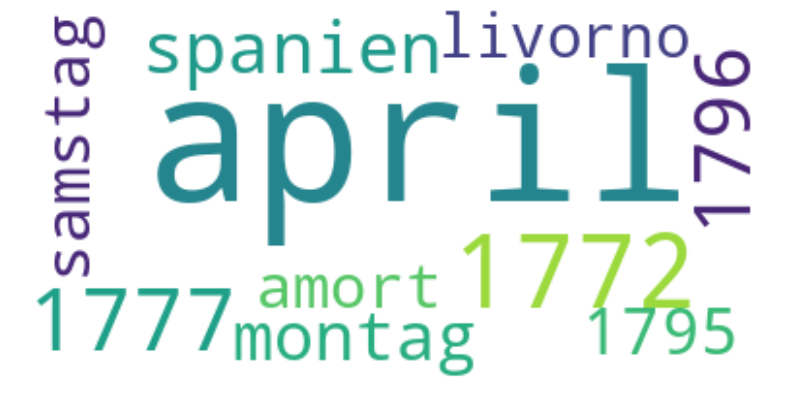

Topic 29:


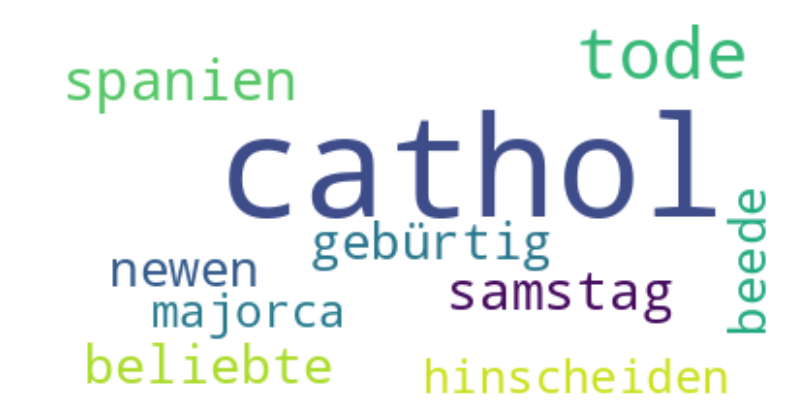

Topic 30:


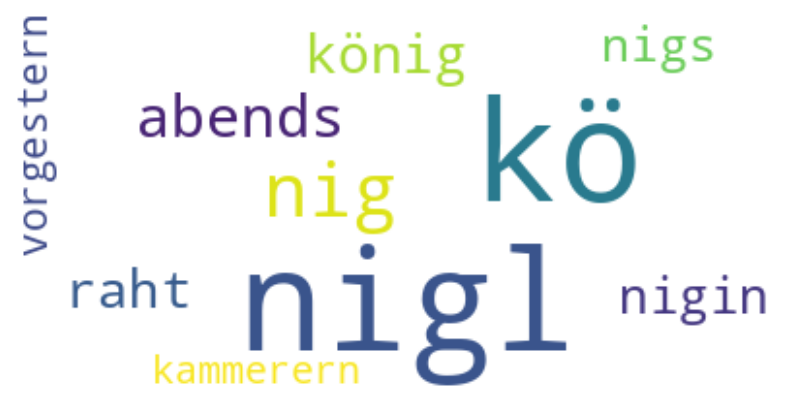

Topic 31:


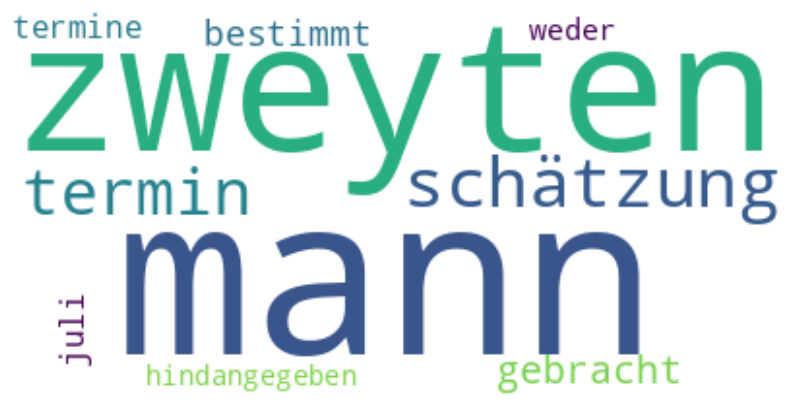

Topic 32:


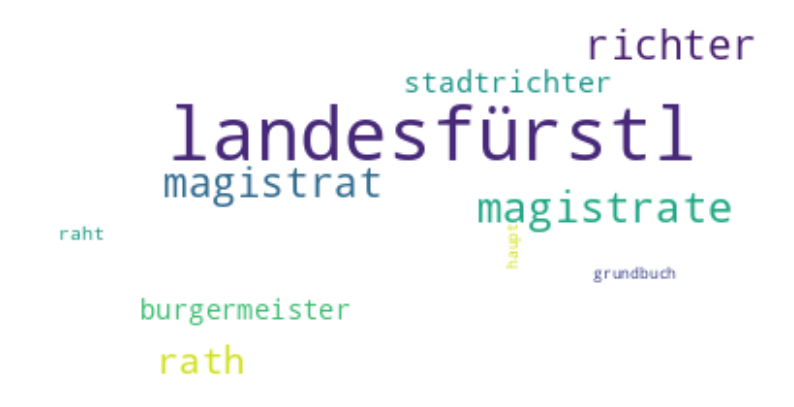

Topic 33:


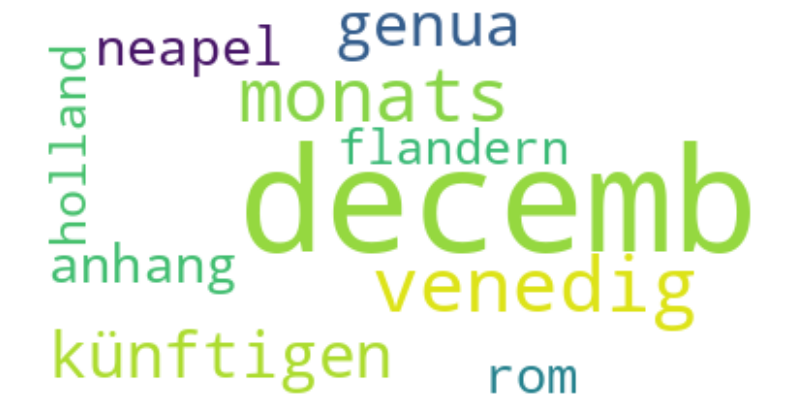

Topic 34:


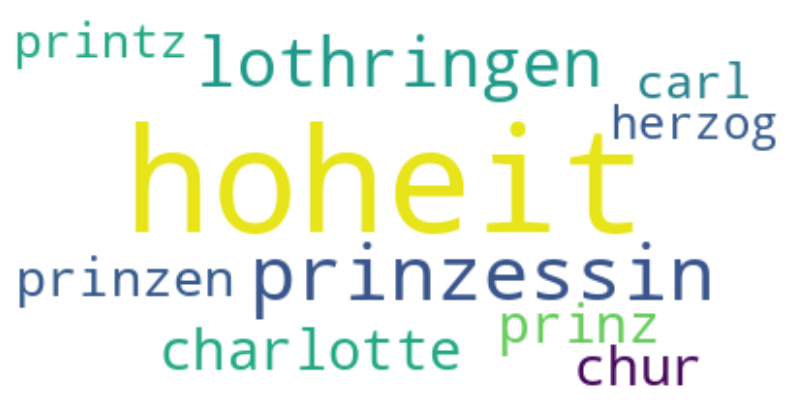

Topic 35:


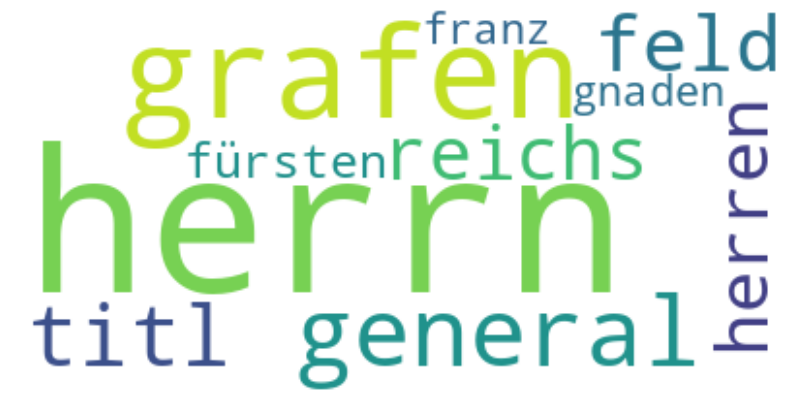

Topic 36:


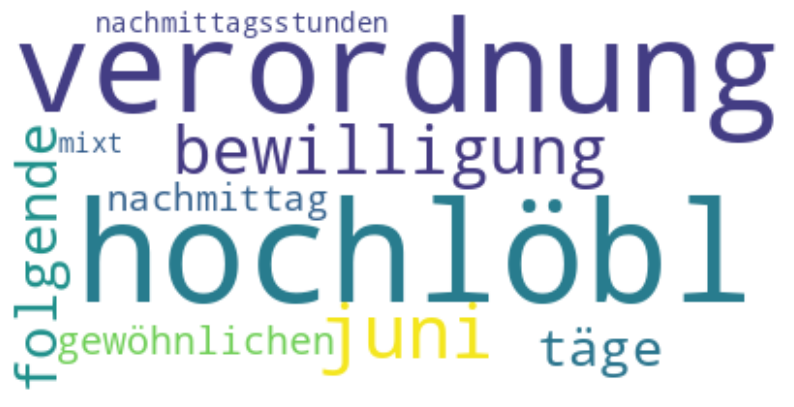

Topic 37:


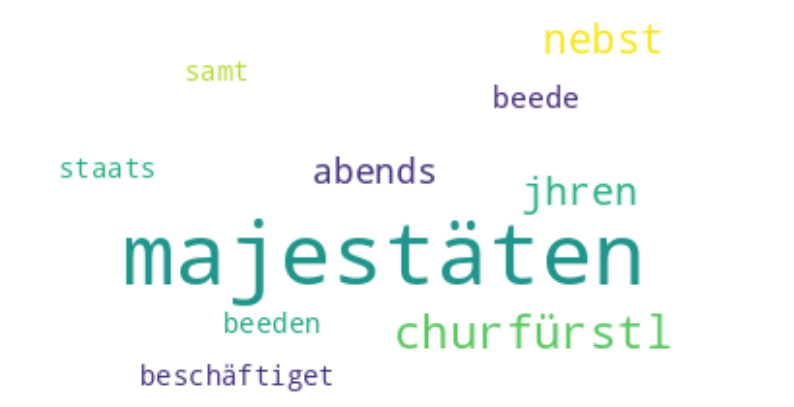

Topic 38:


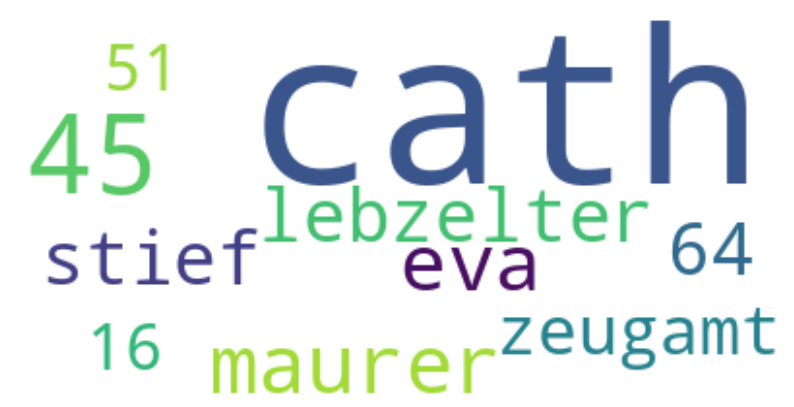

Topic 39:


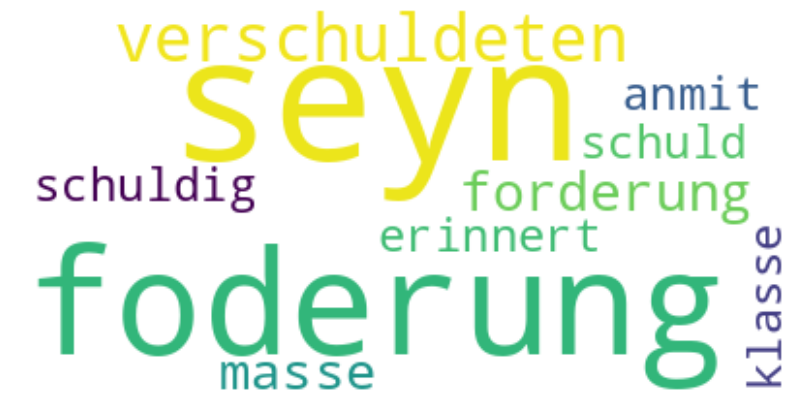

Topic 40:


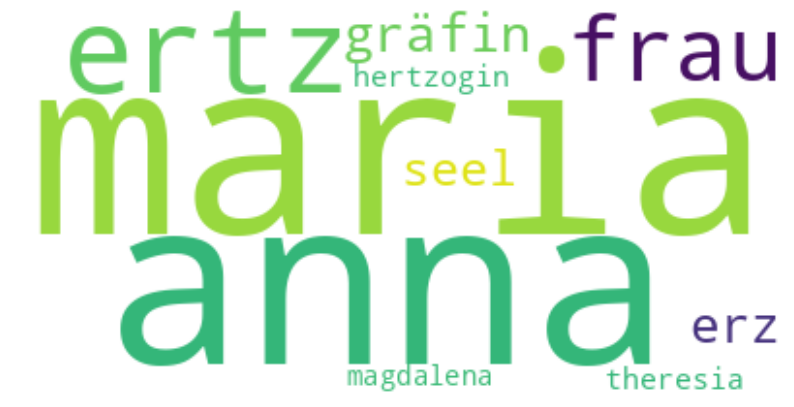

Topic 41:


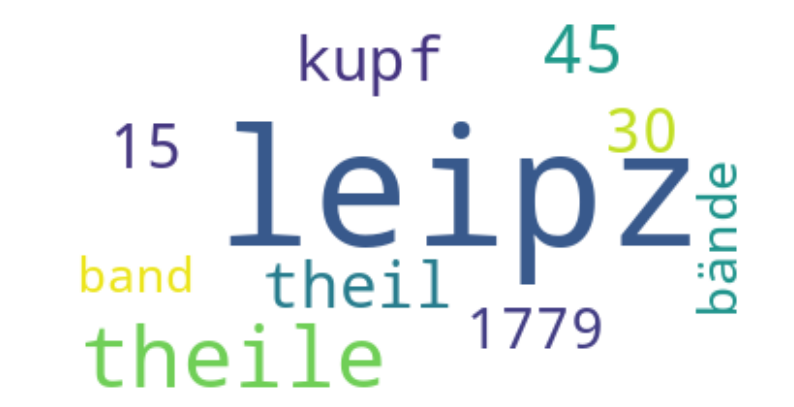

Topic 42:


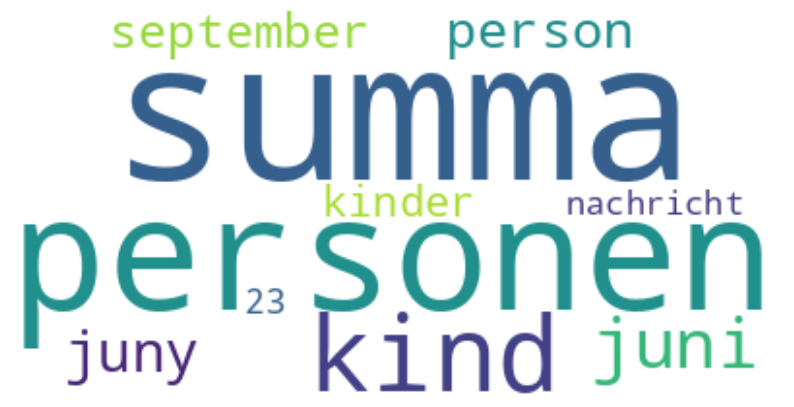

Topic 43:


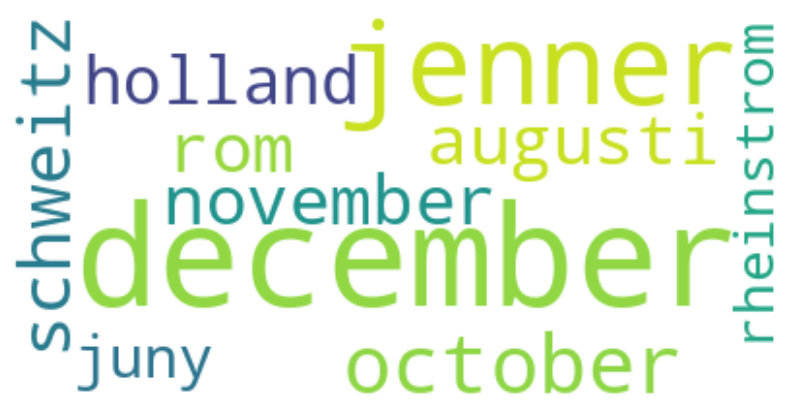

Topic 44:


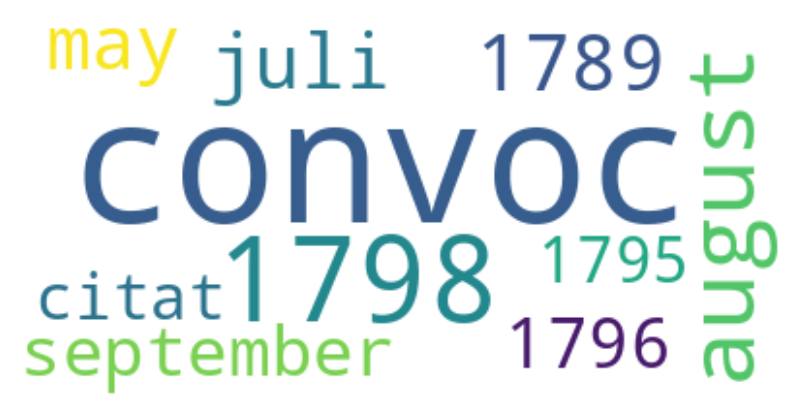

Topic 45:


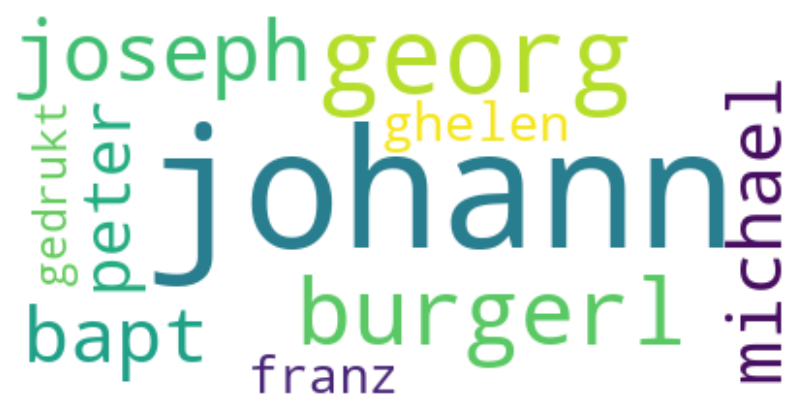

Topic 46:


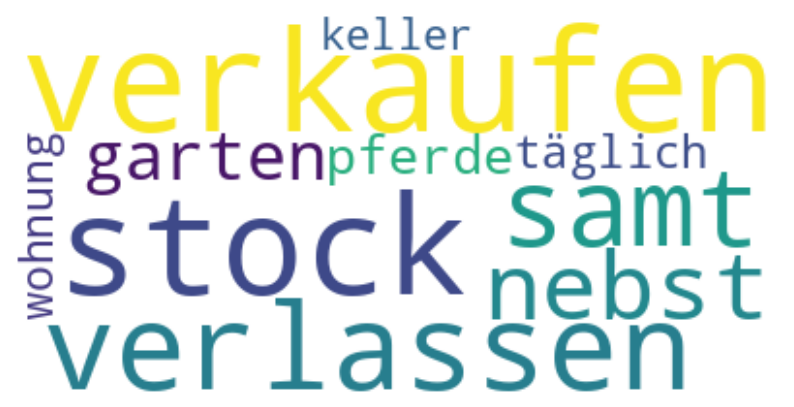

Topic 47:


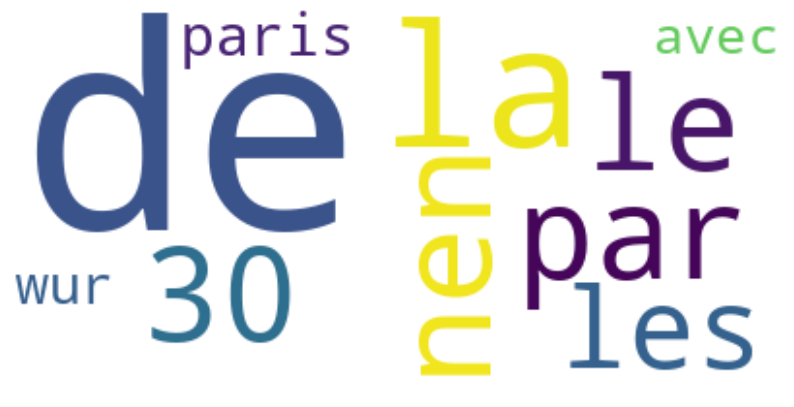

Topic 48:


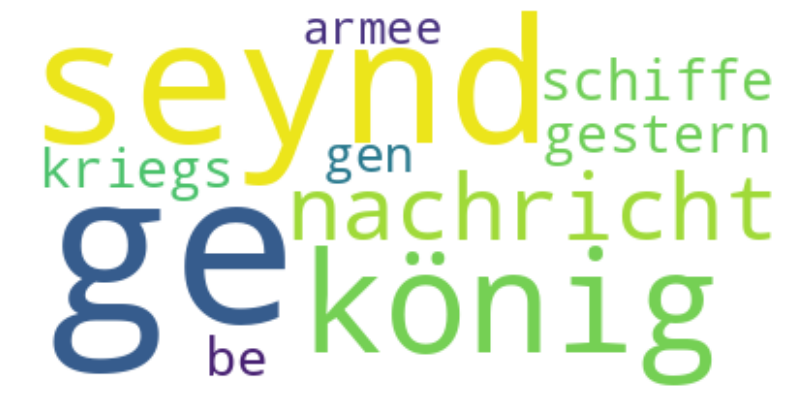

Topic 49:


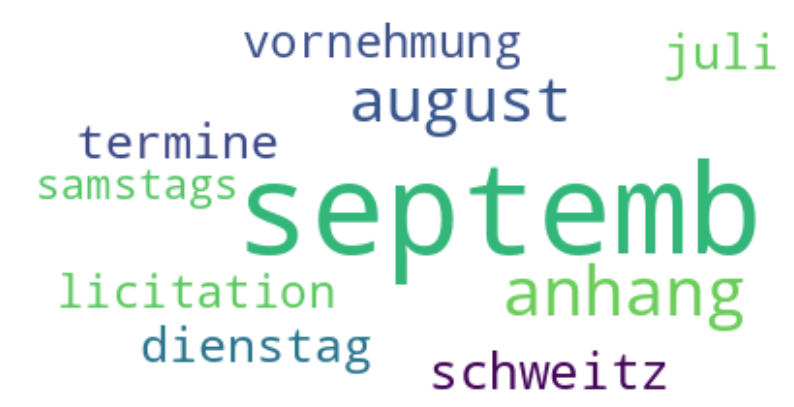

Topic 50:


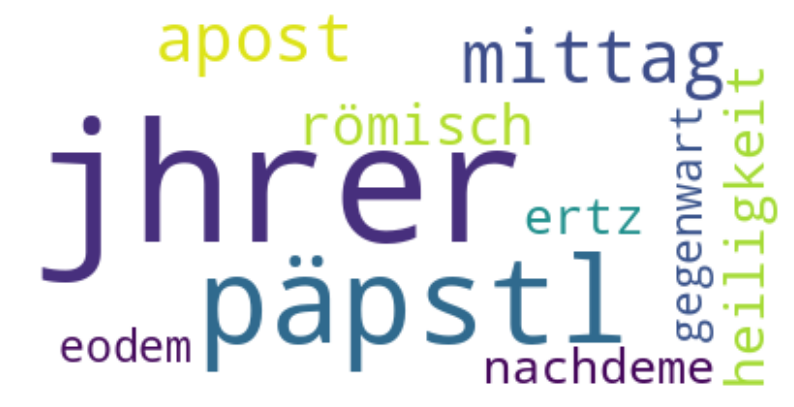

In [ ]:
display_wordcloud(nmf, feature_names, no_top_words)

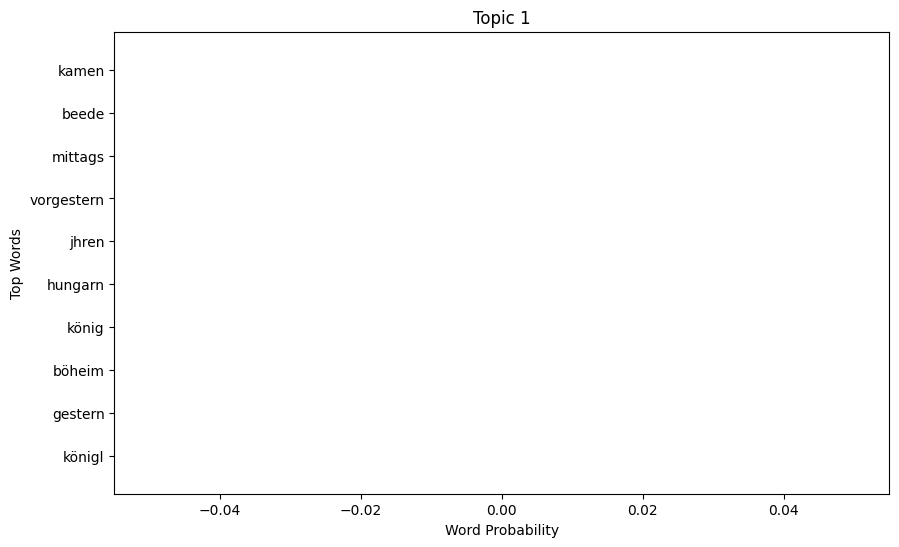

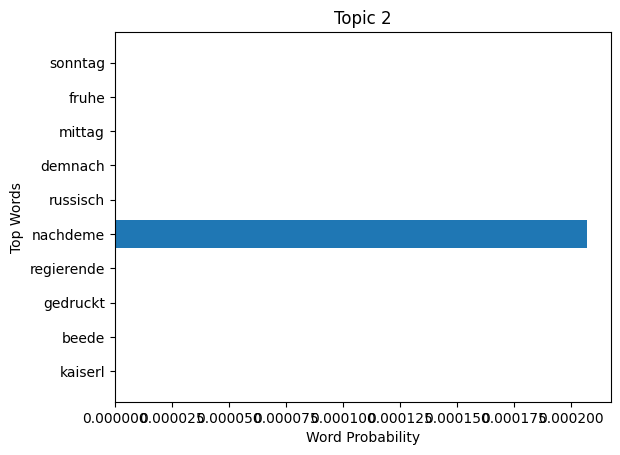

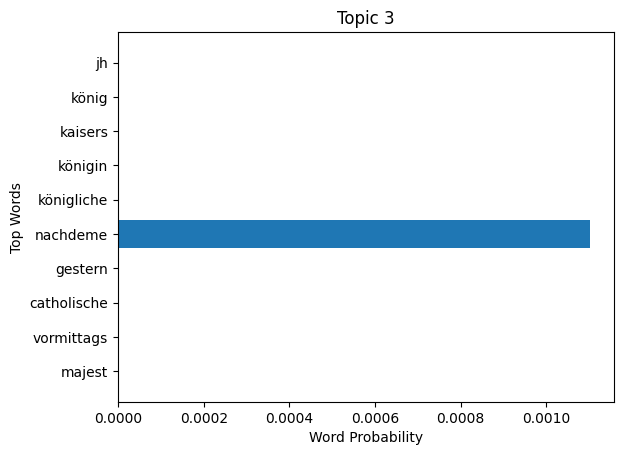

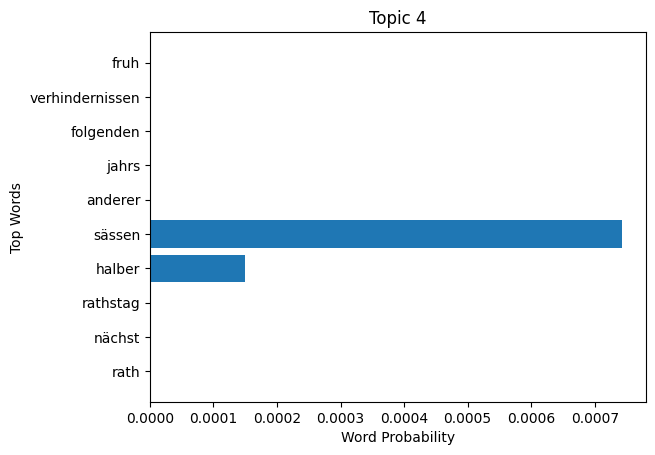

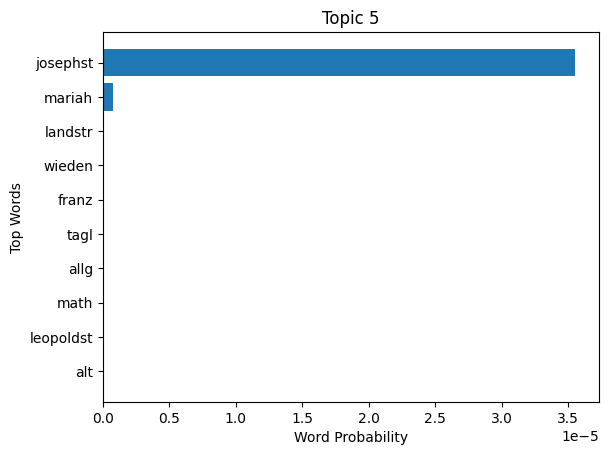

...

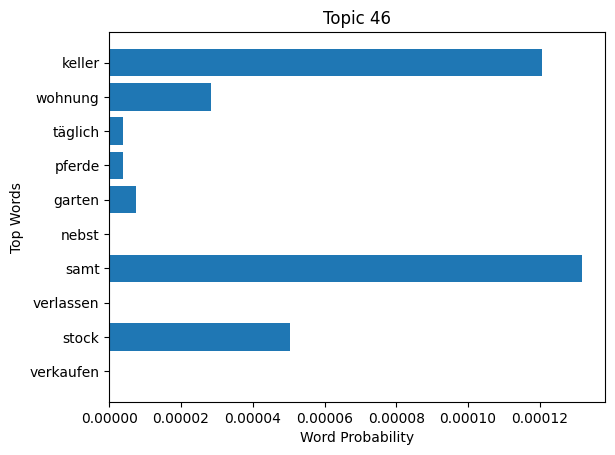

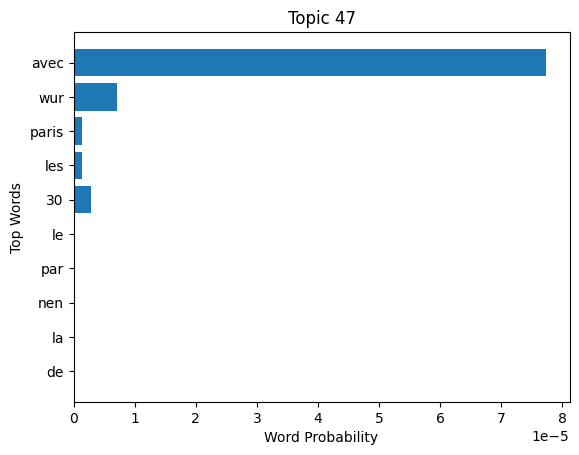

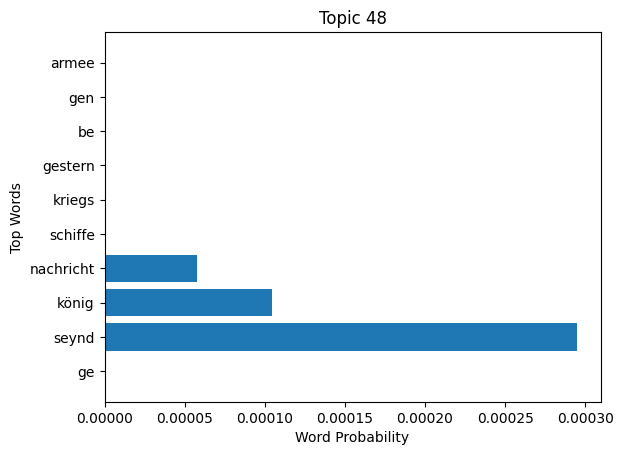

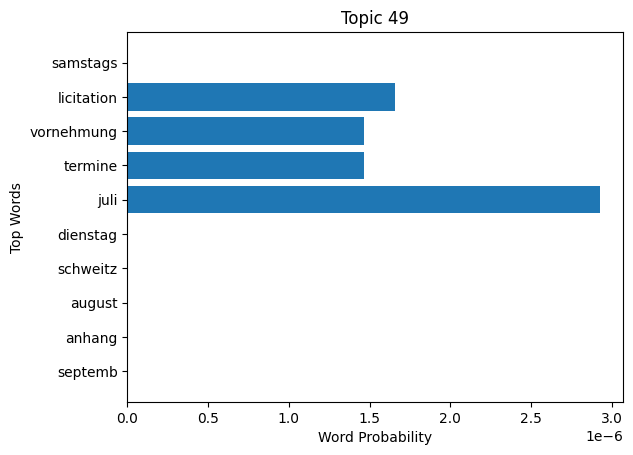

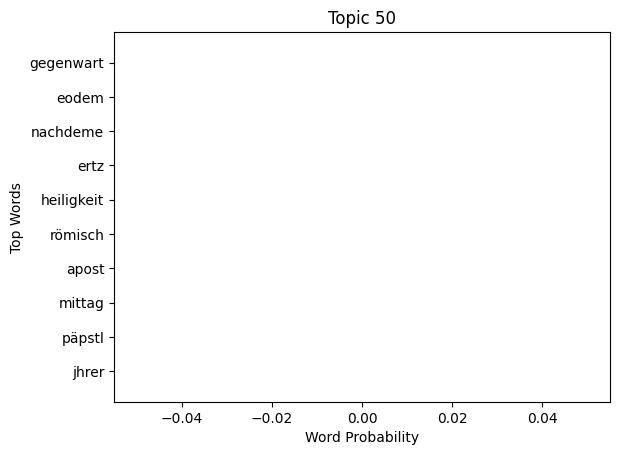

In [ ]:
plt.figure(figsize=(10, 6))
for topic_idx, topic in enumerate(nmf.components_):
    top_words = [feature_names[i] for i in topic.argsort()[:-11:-1]]
    plt.barh(top_words, topic[:-11:-1])
    plt.title(f"Topic {topic_idx+1}")
    plt.xlabel("Word Probability")
    plt.ylabel("Top Words")
    plt.show()


In [ ]:

# Function to extract topics from the model
def get_topics(model, feature_names, n_top_words):
    topics = []
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        topics.append((topic_idx, ", ".join(top_features)))
    return topics



In [ ]:
tfidf_feature_names = vectorizer.get_feature_names_out()


In [ ]:
lda_topics = get_topics(lda, tfidf_feature_names, 10)
nmf_topics = get_topics(nmf, tfidf_feature_names, 10)


In [ ]:
lda_df = pd.DataFrame(lda_topics, columns=['Topic', 'Words'])
nmf_df = pd.DataFrame(nmf_topics, columns=['Topic', 'Words'])


In [ ]:
print("LDA Topics:")
print(lda_df)


LDA Topics:
    Topic  \
0       0   
1       1   
2       2   
3       3   
4       4   
5       5   
6       6   
7       7   
8       8   
9       9   
10     10   
11     11   
12     12   
13     13   
14     14   
15     15   
16     16   
17     17   
18     18   
19     19   
20     20   
21     21   
22     22   
23     23   
24     24   
25     25   
26     26   
27     27   
28     28   
29     29   
30     30   
31     31   
32     32   
33     33   
34     34   
35     35   
36     36   
37     37   
38     38   
39     39   
40     40   
41     41   
42     42   
43     43   
44     44   
45     45   
46     46   
47     47   
48     48   
49     49   

                                                                                                        Words  
0                                    tagl, septemb, alt, theres, oberneust, französis, nunc, wien, neubau, 45  
1                     augsb, sebast, pulver, viii, inpulvere, begebenheiten, auflage, alt, wien, aus

In [ ]:
nmf_df = pd.DataFrame(nmf_topics, columns=['Topic', 'Words'])


In [ ]:
nmf_df.to_csv('/content/drive/MyDrive/topic-specific-corpus-creation/csv_files/nmf_topics-25.csv', encoding='utf-8')

In [ ]:
lda_df.to_csv('/content/drive/MyDrive/topic-specific-corpus-creation/csv_files/lda_topics-25.csv', encoding='utf-8')

In [ ]:
print("\nNMF Topics:")
print(nmf_df)



NMF Topics:
    Topic                                              Words
0       0  königl, gestern, böheim, könig, hungarn, jhren...
1       1  kaiserl, beede, gedruckt, regierende, nachdeme...
2       2  majest, vormittags, catholische, gestern, nach...
3       3  rath, nächst, rathstag, halber, sässen, andere...
4       4  alt, leopoldst, math, allg, tagl, franz, wiede...
5       5  effekten, wägen, wein, dernbergers, weine, büc...
6       6  löbl, verordnung, bewilligung, gefertigte, fru...
7       7  wien, may, juni, 1772, 1796, 1773, haupt, 1785...
8       8  fürstl, chur, landes, amtskanzley, grundbuch, ...
9       9  gräfl, amtskanzley, amtsverwaltung, verwaltera...
10     10  stadt, burgermeister, geben, niemand, vernehme...
11     11  kais, gedruckt, amtskanzley, seiten, demnach, ...
12     12  majestät, kaiserin, könig, königin, raht, kais...
13     13  dito, mittag, montag, dienstag, donnerstag, wa...
14     14  haus, verkaufen, garten, kaufen, michaeler, au...
15     15  

## Evaluation of models
* testing out different evalaution metrics, coherence for LDA and NMF, perplexity for LDA and reconstruction error for NMF

In [ ]:
def get_topics_sklearn(model, vectorizer, n_top_words):
    words = vectorizer.get_feature_names_out()
    topics = []
    for topic_idx, topic in enumerate(model.components_):
        topic_words = [words[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
        topics.append(topic_words)
    return topics

In [ ]:
lda_topics = get_topics_sklearn(lda, vectorizer, 10)
nmf_topics = get_topics_sklearn(nmf, vectorizer, 10)

In [ ]:
nltk.download('stopwords')
stop_words = stopwords.words('german')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
texts = df.text.to_list()

In [ ]:
def preprocess(text):
    return [token for token in gensim.utils.simple_preprocess(text) if token not in stop_words]

# Apply preprocessing
processed_docs = [preprocess(text) for text in texts]


In [ ]:
dictionary = Dictionary(processed_docs)
corpus = [dictionary.doc2bow(doc) for doc in processed_docs]


In [ ]:
coherence_model_lda = CoherenceModel(topics=lda_topics, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(f'LDA Coherence Score: {coherence_lda}')


LDA Coherence Score: 0.4390042346274074


In [ ]:
coherence_model_nmf = CoherenceModel(topics=nmf_topics, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_nmf = coherence_model_nmf.get_coherence()
print(f'NMF Coherence Score: {coherence_nmf}')

NMF Coherence Score: 0.5453651428409235


- The NMF model has a higher coherence score (0.4901) compared to the LDA model (0.3801), indicating that NMF is producing more coherent and interpretable topics for the DIGITARIUM dataset


In [ ]:
lda_perplexity = lda.perplexity(vectorized_text)
lda_perplexity

4003344.43539229

In [ ]:
nmf_reconstruction_err = nmf.reconstruction_err_
nmf_reconstruction_err

269.9067220802575

In [ ]:
print(f"LDA Perplexity: {lda_perplexity}")
print(f"NMF Reconstruction Error: {nmf_reconstruction_err}")


LDA Perplexity: 4003344.43539229
NMF Reconstruction Error: 269.9067220802575


In [ ]:
def compute_topic_diversity(model, feature_names, top_n=10):
    topic_words = []
    for topic in model.components_:
        top_indices = topic.argsort()[::-1][:top_n]
        top_terms = [feature_names[i] for i in top_indices]
        topic_words.append(top_terms)
    all_words = sum(topic_words, [])
    unique_words = set(all_words)
    return round(len(unique_words) / (len(topic_words) * top_n), 3)




In [ ]:
# 1. Load the lda model
with open('/content/drive/MyDrive/topic-specific-corpus-creation/models/lda_model-25.pkl', 'rb') as f:
    lda = pickle.load(f)

TypeError: _reconstruct: First argument must be a sub-type of ndarray

In [ ]:
n_topics = lda_model.components_.shape[0]



In [ ]:
n_topics

50

In [ ]:
# 2. Load the NMF model
with open('/content/drive/MyDrive/topic-specific-corpus-creation/models/nmf_model-25.pkl', 'rb') as f:
    nmf_model = pickle.load(f)

In [ ]:
!pip install --upgrade numpy scikit-learn gensim

In [ ]:
n_topics = nmf_model.components_.shape[0]


In [ ]:


diversity = compute_topic_diversity(lda_model, feature_names, top_n=10)
print(f"📊 LDA topic diversity: {diversity}")


📊 LDA topic diversity: 0.872


In [ ]:
diversity_nmf = compute_topic_diversity(nmf_model, feature_names, top_n=10)
print(f"📊 NMF topic diversity: {diversity_nmf}")


NameError: name 'feature_names' is not defined

LDA Perplexity: Perplexity is a commonly used evaluation metric for topic models, including LDA. It measures how well the model predicts the observed data. Lower perplexity values indicate better model performance. In your case, the LDA Perplexity is quite high, with a value of 2870345.557154866. This suggests that the LDA model is not able to effectively capture the underlying patterns and structure in the data. It might be a sign that the chosen number of topics or the quality of the text data could be further improved.

NMF Reconstruction Error: Reconstruction error is an evaluation metric specific to non-negative matrix factorization (NMF). It measures the dissimilarity between the original data and its approximation reconstructed by the NMF model. Lower reconstruction error values indicate better model performance. In your case, the NMF Reconstruction Error is 13.903349263716057. This suggests that the NMF model has achieved a relatively low level of error in reconstructing the original data.

It's important to note that these evaluation metrics alone might not provide a comprehensive understanding of the topic models' performance. It's recommended to consider other factors such as topic coherence, interpretability of the generated topics, and qualitative assessment of the results to assess the quality and meaningfulness of the topics produced by the models.



In [ ]:
import numpy as np

In [ ]:
import numpy as np

# Get document-topic distributions
doc_topic_dists = nmf_model.transform(vectorized_text)

# List of selected topic indices
selected_topics = [0, 1, 47, 49]

# Dictionary to hold results
top_docs_per_topic = {}

# Loop through each selected topic
for topic_idx in selected_topics:
    topic_probs = doc_topic_dists[:, topic_idx]

    # Get indices of top 3 documents with highest topic probability
    top_indices = topic_probs.argsort()[::-1][:10]

    # Collect document index, topic probability, date, and full text
    top_docs = []
    for i in top_indices:
        doc_entry = {
            "Document Index": i,
            "Topic Probability": topic_probs[i],
            "Date": df.iloc[i]['date'],
            "Full Text": df.iloc[i]['full_text']
        }
        top_docs.append(doc_entry)

    top_docs_per_topic[topic_idx] = top_docs


In [ ]:
for topic_idx, docs in top_docs_per_topic.items():
    print(f"\n--- Top 3 Documents for Topic {topic_idx} ---")
    for doc in docs:
        print(f"Document #{doc['Document Index']} | Date: {doc['Date']} | Topic Probability: {doc['Topic Probability']:.4f}")
        print(doc['Full Text'][:700].strip())  # Preview first 700 characters
        print("-" * 100)



--- Top 3 Documents for Topic 0 ---
Document #32889 | Date: 1760-10-11 | Topic Probability: 0.1728
und Königl.
----------------------------------------------------------------------------------------------------
Document #41596 | Date: 1771-03-23 | Topic Probability: 0.1728
königl.
----------------------------------------------------------------------------------------------------
Document #4562 | Date: 1712-05-21 | Topic Probability: 0.1728
Dero Königl.
----------------------------------------------------------------------------------------------------
Document #26284 | Date: 1751-12-15 | Topic Probability: 0.1728
Nachdem an  Königl.
----------------------------------------------------------------------------------------------------
Document #33441 | Date: 1761-11-18 | Topic Probability: 0.1728
Das Königl.
----------------------------------------------------------------------------------------------------
Document #22880 | Date: 1748-10-26 | Topic Probability: 0.1728
Königl.
--------